# <center>MSIN0143 Group F1 : Programming for Business Analytics </center>
<h2><center>From Clicks to Shares: Understanding the Features that Propel Mashable 
    Articles</center></h2>
<br>

<center>
<h3> Module Leader: Dr. David Alderton </h3>
<br>
<br>
</center>

**Team Members**:
<br>
**Student ID &ensp; Name**<br> 
23110833 &ensp; Ankit Mehani<br>
23098592 &ensp; Khushi Bansal<br>
23195717 &ensp; Po Yu Wang<br>
19073312 &ensp; Sol Goodall<br>

<br>
<br>
<center>
<h4>Word Count:&ensp; 1994</h4>
</center>    

## Outline

1. [Introduction](#intr)
    1. [1.1 Problem Statement](#problemStatement)
    2. [1.2 Objectives](#objectives)
    3. [1.3 Data](#data)
2. [Data Preperation](#dataPreperation)
    1. [2.1 Feature Selection](#featureSelection)
    2. [2.2 Dropping Missing Values](#missingValues)
    3. [2.3 Data Transformation](#dataTrans)
    4. [2.4 Revisit Data & Dropping False Data](#revisit)
3. [Descriptive and Exploratory Data Analysis](#des)
4. [Predictive Models](#pred)
    1. [4.1 Importing ML Libraries](#libraries)
    2. [4.2 Model#1 - Linear Regression Model](#LRM)
    3. [4.3 Model#2 - Decision Tree Model](#DT)
    4. [4.4 Model#3 - Random Forest Model](#RF)
    5. [4.5 Model#4 - Gradient Boost Model](#GB)
    6. [4.6 Model#5 - SVM and GridSearch Model](#GS)
    7. [4.7 Evaluation and Insights](#insights)
5. [Conclusion and Business Recommendations](#con&recom)
    1. [5.1 Conclusion](#conclusion)
    2. [5.2 Recommendations](#recom)
    3. [5.3 Next Steps](#next)
6. [References](#ref)
7. [Appendix](#Appendix)
    1. [7.1 Trello Screenshots](#Trello_screenshots)

## <a id='intr'><font color=black><center>1. Introduction</center></font></a>

### <a id='problemStatement'><font color=black>1.1 Problem Statement</font></a>

What defines a high-quality digital news article? To what extent are readers satisfied with the services provided by news outlets? Moreover, is there a consensus on readers' preferences for online content, or does individual preference significantly influence engagement? This report delves into these questions by examining a dataset of over 40,000 articles from Mashable. This prominent and autonomous digital news platform focuses on aspects such as; digital culture, social media, and technology.


This study serves a dual purpose by not only assisting Mashable but also aiding other blogging sites or digital news platforms in selecting optimal methods for analyzing articles. The goal is to enhance visibility, ultimately improving and aligning their services more effectively with customers' needs. 


### <a id='objectives'><font color=black>1.2 Objectives</font></a>

This report aims to investigate the factors influencing the number of shares for articles released on the Mashable website (www.mashable.com) over two years. To ensure the accuracy and quality of the data, a thorough cleaning process will be implemented on the dataset. Subsequently, an exploratory data analysis will be conducted to delve into the dataset's intricacies, summarising key features and exploring potential relationships between different attributes.
After exploring the data, the report will develop a predictive model for the number of shares. These models will visually represent and forecast how different characteristics of articles impact share counts. The final sections of the report will present relevant business recommendations based on the findings and evaluate the performance of the descriptive and predictive models to determine which is more effective for understanding and predicting the sharing patterns of Mashable articles.

### <a id='data'><font color=black>1.3 Data</font></a>

The dataset is from the UCI Machine Learning Repository, uploaded by Kelwin Fernandes, Pedro Vinagre, Paulo Cortez and Pedro Sernadela. The dataset includes 39797 entries with 61 attributes  (58 predictive attributes, two non-predictive, 1 goal field), qualitative and quantitative.

In [1]:
#import libraries - Pandas, numpy, matplotlib, seaborn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ignore all warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
#Load the dataset into df_mashable dataframe
df_mashable = pd.read_csv('OnlineNewsPopularity.csv')

In [3]:
#Get basic information of dataset - Data Types, record count and column count
df_mashable.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   url                             39644 non-null  object 
 1    timedelta                      39644 non-null  float64
 2    n_tokens_title                 39644 non-null  float64
 3    n_tokens_content               39644 non-null  float64
 4    n_unique_tokens                39644 non-null  float64
 5    n_non_stop_words               39644 non-null  float64
 6    n_non_stop_unique_tokens       39644 non-null  float64
 7    num_hrefs                      39644 non-null  float64
 8    num_self_hrefs                 39644 non-null  float64
 9    num_imgs                       39644 non-null  float64
 10   num_videos                     39644 non-null  float64
 11   average_token_length           39644 non-null  float64
 12   num_keywords                   

## <a id='dataPreperation'><center><font color=black>2. Data Preperation</font></center></a>

### <a id='featureSelection'><font color=black>2.1 Feature Selection</font></a>

In [4]:
# Remove leading and trailing spaces from column names
df_mashable.columns = df_mashable.columns.str.strip()

All irrelevant columns are dropped since the study is about how an article’s characteristics affect its shareability.

In [5]:
# List of columns to drop
columns_to_drop = ["url", "n_tokens_content", "n_unique_tokens", 
                   "num_hrefs", "kw_min_min", 
                   "kw_max_min", "kw_avg_min",
                   "kw_min_max", "kw_max_max", 
                   "kw_avg_max", "kw_min_avg", 
                   "kw_max_avg", "kw_avg_avg", 
                   "self_reference_min_shares", 
                   "self_reference_max_shares", 
                   "abs_title_subjectivity", 
                   "abs_title_sentiment_polarity", 
                   "min_positive_polarity",
                   "max_positive_polarity", 
                   "min_negative_polarity", 
                   "max_negative_polarity", 
                   "rate_positive_words",
                   "rate_negative_words", 
                   "kw_min_min", "kw_max_avg",
                   "LDA_00", "LDA_01", "LDA_02",
                   "LDA_03", "LDA_04"]


# Drop the specified columns
df_mashable = df_mashable.drop(columns=columns_to_drop, errors='ignore')


### <a id='missingValues'><font color=black>2.2 Dropping missing values</font></a>

There were no missing values in the dataset we obtained from UCI Machine Learning Repository(https://archive.ics.uci.edu/). Hence this step was not required as part of data cleaning.

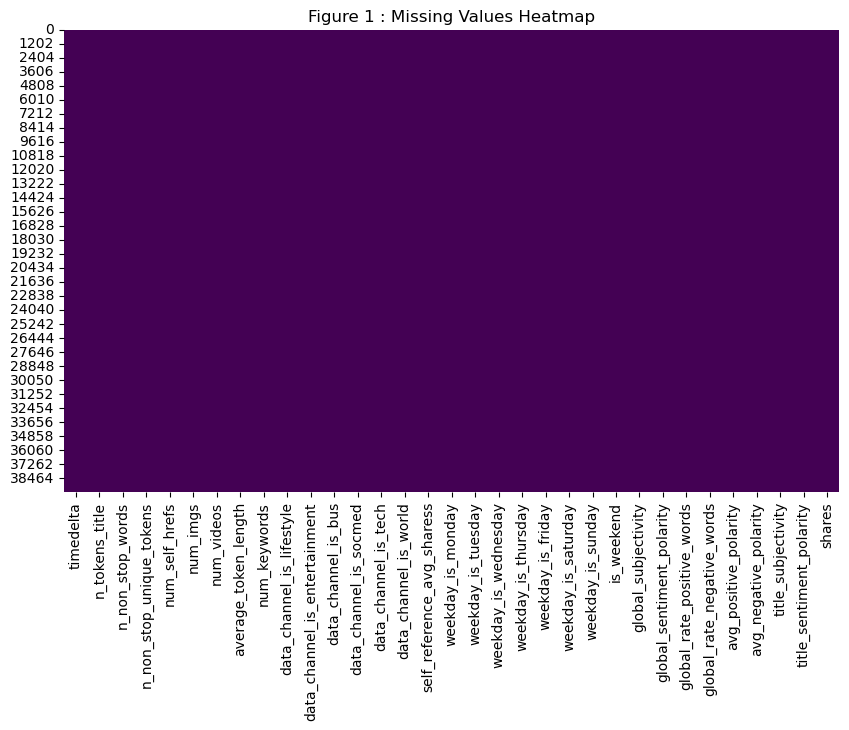

In [6]:
# Create a heatmap to visualize missing values
plt.figure(figsize=(10, 6))
sns.heatmap(df_mashable.isnull(), cbar=False, cmap='viridis')

plt.title('Figure 1 : Missing Values Heatmap')
plt.show()

### <a id='dataTrans'><font color=black>2.3 Data Transformation</font></a>

In this stage of the data processing pipeline, the categorical variables representing weekdays and data channels have been consolidated into two new variables, namely 'weekday' and 'channel', respectively. To facilitate precise allocation within the dataset, the original weekday and data channel variables have been encoded with numeric values. For example, "Monday" = 1 and "data_channel_is_world" = 6.

In [7]:
df_mashable['weekday'] = (df_mashable['weekday_is_monday']*1 +
                          df_mashable['weekday_is_tuesday']*2 +
                          df_mashable['weekday_is_wednesday']*3 +
                          df_mashable['weekday_is_thursday']*4 +
                          df_mashable['weekday_is_friday']*5 +
                          df_mashable['weekday_is_saturday']*6 +
                          df_mashable['weekday_is_sunday']*7).astype(int)

In [8]:
#Get unique values for new column weekday
sorted(df_mashable['weekday'].unique())

[1, 2, 3, 4, 5, 6, 7]

In [9]:
df_mashable['channel'] = (
    df_mashable['data_channel_is_lifestyle'].astype(int) * 1 +
    df_mashable['data_channel_is_entertainment'].astype(int) * 2 +
    df_mashable['data_channel_is_bus'].astype(int) * 3 +
    df_mashable['data_channel_is_socmed'].astype(int) * 4 +
    df_mashable['data_channel_is_tech'].astype(int) * 5 +
    df_mashable['data_channel_is_world'].astype(int) * 6
)

# Increment each value in the 'channel' column by 1
df_mashable['channel'] += 1

In [10]:
#Get unique values for new column channel
sorted(df_mashable['channel'].unique())

[1, 2, 3, 4, 5, 6, 7]

In [11]:
# Map numeric values to corresponding weekdays
weekday_labels = ["Mon", "Tues", "Wed", "Thurs", "Fri", 
                  "Sat", "Sun"]
df_mashable['weekday'] = pd.Categorical(df_mashable[
    'weekday'], categories=range(1, 8), ordered=True)

df_mashable['weekday'] = df_mashable[
    'weekday'].map(dict(zip(range(1, 8),weekday_labels)))

# Map numeric values to corresponding channels
channel_labels = ["Other", "Lifestyle", "Entertainment", 
                  "Business", "Social_Media", 
                  "Technology", "World"]

df_mashable['channel'] = pd.Categorical(df_mashable[
    'channel'], categories=range(1, 8), ordered=True)

df_mashable['channel'] = df_mashable[
    'channel'].map(dict(zip(range(1, 8), channel_labels)))


In [12]:
df_mashable['weekday']

0        Mon
1        Mon
2        Mon
3        Mon
4        Mon
        ... 
39639    Wed
39640    Wed
39641    Wed
39642    Wed
39643    Wed
Name: weekday, Length: 39644, dtype: category
Categories (7, object): ['Mon' < 'Tues' < 'Wed' < 'Thurs' < 'Fri' < 'Sat' < 'Sun']

In [13]:
df_mashable['channel']

0        Entertainment
1             Business
2             Business
3        Entertainment
4           Technology
             ...      
39639       Technology
39640     Social_Media
39641            Other
39642            World
39643    Entertainment
Name: channel, Length: 39644, dtype: category
Categories (7, object): ['Other' < 'Lifestyle' < 'Entertainment' < 'Business' < 'Social_Media' < 'Technology' < 'World']

Given the positively skewed distribution observed in the histogram of the variable representing the frequency of shares, a logarithmic transformation has been applied to normalise the data. This transformation enhances the symmetry of the distribution, facilitating more robust analysis and interpretation.

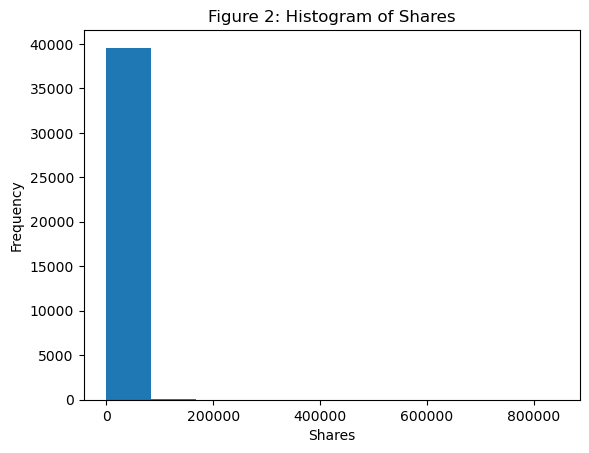

In [14]:
# Plot the histogram of shares
plt.hist(df_mashable['shares'])
plt.title('Figure 2: Histogram of Shares')
plt.xlabel('Shares')
plt.ylabel('Frequency')
plt.show()

In [15]:
# Apply log transformation to the 'shares' column
df_mashable['log_shares'] = np.log(df_mashable['shares'])


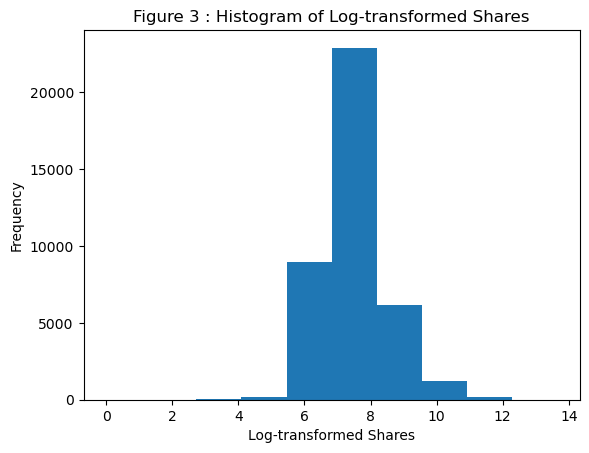

In [16]:
# Plot the histogram of log-transformed shares
plt.hist(df_mashable['log_shares'])
plt.title('Figure 3 : Histogram of Log-transformed Shares')
plt.xlabel('Log-transformed Shares')
plt.ylabel('Frequency')
plt.show()

Furthermore, the variable 'is_weekend' has undergone a conversion from an array type to categorical data, aligning with the requirements of the categorical data format. This transformation ensures the appropriate representation of the 'is_weekend' variable for subsequent analyses in the Python project.

In [17]:
# Convert is_weekend to categorical data type
df_mashable['is_weekend'] = df_mashable['is_weekend'].astype('category')

In [18]:
df_mashable['is_weekend'].unique()

[0.0, 1.0]
Categories (2, float64): [0.0, 1.0]

In [19]:
#Update dataset for this project - Move to mashable_upd
mashable_upd = df_mashable.copy()

In [20]:
mashable_upd.head()

,timedelta,n_tokens_title,n_non_stop_words,n_non_stop_unique_tokens,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,...,global_rate_positive_words,global_rate_negative_words,avg_positive_polarity,avg_negative_polarity,title_subjectivity,title_sentiment_polarity,shares,weekday,channel,log_shares
0,731.0,12.0,1.0,0.815385,2.0,1.0,0.0,4.680365,5.0,0.0,...,0.045662,0.013699,0.378636,-0.350000,0.500000,-0.187500,593,Mon,Entertainment,6.385194
1,731.0,9.0,1.0,0.791946,1.0,1.0,0.0,4.913725,4.0,0.0,...,0.043137,0.015686,0.286915,-0.118750,0.000000,0.000000,711,Mon,Business,6.566672
2,731.0,9.0,1.0,0.663866,1.0,1.0,0.0,4.393365,6.0,0.0,...,0.056872,0.009479,0.495833,-0.466667,0.000000,0.000000,1500,Mon,Business,7.313220
3,731.0,9.0,1.0,0.665635,0.0,1.0,0.0,4.404896,7.0,0.0,...,0.041431,0.020716,0.385965,-0.369697,0.000000,0.000000,1200,Mon,Entertainment,7.090077
4,731.0,13.0,1.0,0.540890,19.0,20.0,0.0,4.682836,7.0,0.0,...,0.074627,0.012127,0.411127,-0.220192,0.454545,0.136364,505,Mon,Technology,6.224558


Here log transformation is performed using np.log1p on selected columns to address issues with zero values.

In [21]:
# np.log1p is used for log transformation to avoid issues with zero values.

# Log transformation for selected columns
mashable_upd['num_self_hrefs'] = np.log1p(mashable_upd['num_self_hrefs'])
mashable_upd['num_imgs'] = np.log1p(mashable_upd['num_imgs'])
mashable_upd['num_videos'] = np.log1p(mashable_upd['num_videos'])
mashable_upd['average_token_length'] = np.log1p(mashable_upd['average_token_length'])
mashable_upd['self_reference_avg_sharess'] = np.log1p(mashable_upd['self_reference_avg_sharess'])

# Display summary statistics
#print(mashable_upd.describe())
mashable_upd.describe()


,timedelta,n_tokens_title,n_non_stop_words,n_non_stop_unique_tokens,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,...,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,avg_positive_polarity,avg_negative_polarity,title_subjectivity,title_sentiment_polarity,shares,log_shares
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,354.530471,10.398749,0.996469,0.689175,1.208878,1.116427,0.400420,1.685367,7.223767,0.052946,...,0.443370,0.119309,0.039625,0.016612,0.353825,-0.259524,0.282353,0.071425,3395.380184,7.474855
std,214.163767,2.114037,5.231231,3.264816,0.692698,0.973755,0.680486,0.299298,1.909130,0.223929,...,0.116685,0.096931,0.017429,0.010828,0.104542,0.127726,0.324247,0.265450,11626.950749,0.930486
min,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,-0.393750,0.000000,0.000000,0.000000,-1.000000,0.000000,-1.000000,1.000000,0.000000
25%,164.000000,9.000000,1.000000,0.625739,0.693147,0.693147,0.000000,1.700814,6.000000,0.000000,...,0.396167,0.057757,0.028384,0.009615,0.306244,-0.328383,0.000000,0.000000,946.000000,6.852243
50%,339.000000,10.000000,1.000000,0.690476,1.386294,0.693147,0.000000,1.734145,7.000000,0.000000,...,0.453457,0.119117,0.039023,0.015337,0.358755,-0.253333,0.150000,0.000000,1400.000000,7.244228
75%,542.000000,12.000000,1.000000,0.754630,1.609438,1.609438,0.693147,1.767268,9.000000,0.000000,...,0.508333,0.177832,0.050279,0.021739,0.411428,-0.186905,0.500000,0.150000,2800.000000,7.937375
max,731.000000,23.000000,1042.000000,650.000000,4.762174,4.859812,4.521789,2.201829,10.000000,1.000000,...,1.000000,0.727841,0.155488,0.184932,1.000000,0.000000,1.000000,1.000000,843300.000000,13.645078


### <a id='revisit'><font color=black>2.4 Revisit Data & Dropping False Data</font></a>

In [22]:
mashable_upd['n_non_stop_words'].describe()

count    39644.000000
mean         0.996469
std          5.231231
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max       1042.000000
Name: n_non_stop_words, dtype: float64

In [23]:
mashable_upd['n_non_stop_words'].unique()

array([0.99999999, 0.99999999, 0.99999999, ..., 1.        , 1.        ,
       1.        ])

To enhance the reliability of our analysis, the report focuses on the 'n_non_stop_words' column, calculating the first quartile (Q1), third quartile (Q3), and interquartile range (IQR). Employing the IQR method for outlier detection, we derived lower and upper bounds. Filtering the DataFrame based on these bounds allowed us to effectively remove outliers. The summary statistics for the 'n_non_stop_words' column were then printed, providing a concise overview of its distribution after this transformation and data filtration.

In [24]:
#remove outliers

n_non_stop_words_Q1 = mashable_upd['n_non_stop_words'].quantile(0.25)
n_non_stop_words_Q3 = mashable_upd['n_non_stop_words'].quantile(0.75)
n_non_stop_words_IQR = n_non_stop_words_Q3 - n_non_stop_words_Q1
min_words = n_non_stop_words_Q1 - 1.5 * n_non_stop_words_IQR
max_words = n_non_stop_words_Q3 + 1.5 * n_non_stop_words_IQR

# Filter the DataFrame based on the calculated min and max values
mashable_upd = mashable_upd[(mashable_upd['n_non_stop_words'] >= 
                                                 min_words) &
             (mashable_upd['n_non_stop_words'] <= max_words)]

# Print updated statistics for the 'n_non_stop_words' column
print(mashable_upd['n_non_stop_words'].describe())

count    3.681700e+04
mean     1.000000e+00
std      2.712559e-09
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
Name: n_non_stop_words, dtype: float64


In [25]:
# Calculate quartiles and IQR
Q1 = mashable_upd['n_non_stop_words'].quantile(0.25)
Q3 = mashable_upd['n_non_stop_words'].quantile(0.75)
IQR = Q3 - Q1

# Define the minimum and maximum values for non-stop words without outliers
min_words = Q1 - 1.5 * IQR
max_words = Q3 + 1.5 * IQR

print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Min threshold:", min_words)
print("Max threshold:", max_words)

# Remove outliers
mashable_upd = mashable_upd[(mashable_upd['n_non_stop_words'] >= 
                             min_words) & 
                            (mashable_upd['n_non_stop_words'] <= 
                             max_words)]

# Print the updated summary
print(mashable_upd['n_non_stop_words'].describe())


Q1: 0.999999994083
Q3: 0.999999997753
IQR: 3.669999970590254e-09
Min threshold: 0.999999988578
Max threshold: 1.0000000032579999
count    3.608000e+04
mean     1.000000e+00
std      2.499062e-09
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
Name: n_non_stop_words, dtype: float64


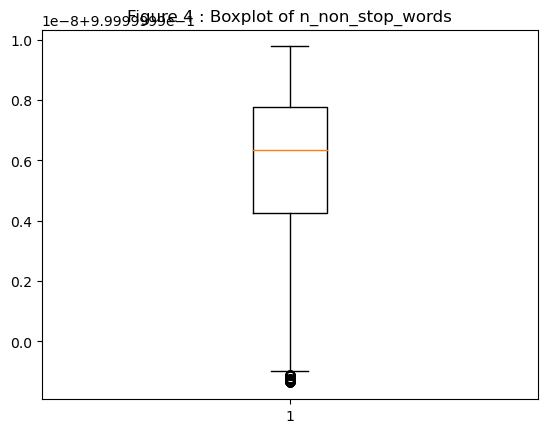

In [26]:
# Boxplot for 'n_non_stop_words'
plt.boxplot(mashable_upd['n_non_stop_words'])
plt.title('Figure 4 : Boxplot of n_non_stop_words')
plt.show()

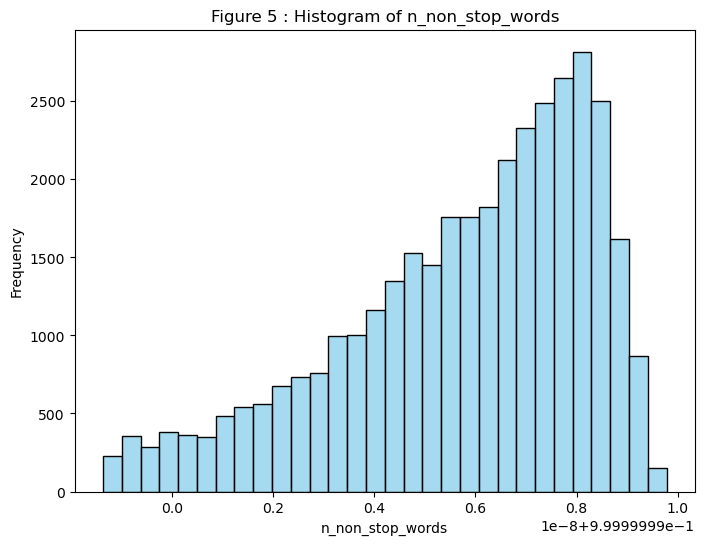

In [27]:
plt.figure(figsize=(8, 6))
sns.histplot(mashable_upd['n_non_stop_words'], bins=30, kde=False, 
             color='skyblue', edgecolor='black')

plt.title('Figure 5 : Histogram of n_non_stop_words')
plt.xlabel('n_non_stop_words')
plt.ylabel('Frequency')

plt.show()

In our data analysis, we constructed a correlation matrix and heatmap to identify highly correlated variables. Variables with a correlation above 0.5, such as "is_weekend," "n_non_stop_words," and "timedelta," were dropped to address multicollinearity concerns and streamline the dataset for subsequent analyses. This feature selection process aimed to enhance the dataset's suitability by eliminating redundant or less informative variables.

In [28]:

correlation_matrix = mashable_upd.corr()

# Display correlation matrix
correlation_matrix

,timedelta,n_tokens_title,n_non_stop_words,n_non_stop_unique_tokens,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,...,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,avg_positive_polarity,avg_negative_polarity,title_subjectivity,title_sentiment_polarity,shares,log_shares
timedelta,1.000000,-0.248690,-0.107791,0.078168,0.010964,-0.097501,-0.048853,-0.058789,0.053060,0.056984,...,0.047255,0.124737,0.156825,-0.025824,0.046211,0.050115,-0.017264,0.043970,0.017098,0.029618
n_tokens_title,-0.248690,1.000000,0.023731,-0.014321,0.029617,-0.015482,0.097749,-0.091212,-0.018054,-0.074976,...,-0.033315,-0.078305,-0.064085,0.036743,-0.035201,-0.046811,0.079115,0.003791,0.005457,-0.022255
n_non_stop_words,-0.107791,0.023731,1.000000,-0.611277,0.120429,0.311965,0.059179,0.012734,0.114462,0.038497,...,-0.029424,-0.036801,0.059014,0.077347,0.000939,-0.076908,0.012210,0.015582,-0.014975,-0.013842
n_non_stop_unique_tokens,0.078168,-0.014321,-0.611277,1.000000,-0.186525,-0.516574,0.041955,-0.048149,-0.118798,0.003964,...,0.004440,-0.025499,0.010921,0.025704,-0.012190,-0.002322,-0.032590,-0.040757,-0.014446,-0.053609
num_self_hrefs,0.010964,0.029617,0.120429,-0.186525,1.000000,0.236730,0.122584,-0.085227,0.081583,-0.074136,...,0.026270,0.053880,0.038153,-0.039416,0.020750,-0.013357,-0.000737,0.023633,0.010169,0.058301
num_imgs,-0.097501,-0.015482,0.311965,-0.516574,0.236730,1.000000,-0.135180,0.042593,0.120668,0.023017,...,0.139065,0.055066,-0.014635,0.011092,0.132051,-0.072603,0.074141,0.048796,0.048017,0.109113
num_videos,-0.048853,0.097749,0.059179,0.041955,0.122584,-0.135180,1.000000,-0.110175,0.004112,-0.066777,...,0.116536,-0.019962,0.073228,0.165647,0.121656,-0.137305,0.074896,0.018463,0.045320,0.059547
average_token_length,-0.058789,-0.091212,0.012734,-0.048149,-0.085227,0.042593,-0.110175,1.000000,0.025836,-0.049225,...,-0.138817,-0.083538,-0.192754,-0.086194,-0.080707,0.044031,-0.034516,-0.028235,-0.007436,-0.045333
num_keywords,0.053060,-0.018054,0.114462,-0.118798,0.081583,0.120668,0.004112,0.025836,1.000000,0.130883,...,0.081968,0.085239,0.055834,-0.030382,0.057604,0.008006,0.011020,0.034737,0.025448,0.074851
data_channel_is_lifestyle,0.056984,-0.074976,0.038497,0.003964,-0.074136,0.023017,-0.066777,-0.049225,0.130883,1.000000,...,0.064755,0.084876,0.071710,-0.016068,0.068520,0.004838,0.003649,0.034119,0.007189,0.033592


In [29]:
correlation_matrix = mashable_upd.corr()

# Set a threshold for correlation
threshold = 0.50

highly_correlated_columns = correlation_matrix[abs(correlation_matrix) > threshold].stack().index.tolist()

# Print the list of highly correlated columns
print("Highly correlated columns:")
for col1, col2 in highly_correlated_columns:
    if col1 != col2:
        print(f"{col1} and {col2}: {correlation_matrix.loc[col1, col2]}")

Highly correlated columns:
n_non_stop_words and n_non_stop_unique_tokens: -0.6112766203677623
n_non_stop_unique_tokens and n_non_stop_words: -0.6112766203677623
n_non_stop_unique_tokens and num_imgs: -0.5165737601846255
num_self_hrefs and self_reference_avg_sharess: 0.5979455549624851
num_imgs and n_non_stop_unique_tokens: -0.5165737601846255
self_reference_avg_sharess and num_self_hrefs: 0.5979455549624851
global_sentiment_polarity and global_rate_positive_words: 0.5459039008163905
global_sentiment_polarity and global_rate_negative_words: -0.5608056537646304
global_rate_positive_words and global_sentiment_polarity: 0.5459039008163905
global_rate_negative_words and global_sentiment_polarity: -0.5608056537646304
shares and log_shares: 0.5118496384833567
log_shares and shares: 0.5118496384833567


In [30]:
#Remove is_weekend - Since high correlation with weekday 
#Remove timedelta - not helpful to predict shares.

    
columns_to_remove = ["is_weekend", "n_non_stop_words", "timedelta",
                     "weekday_is_monday","weekday_is_tuesday","weekday_is_wednesday",
                    "weekday_is_thursday","weekday_is_friday","weekday_is_saturday",
                    "weekday_is_sunday","data_channel_is_lifestyle",
                     "data_channel_is_entertainment","data_channel_is_bus",
                     "data_channel_is_socmed",
                    "data_channel_is_tech","data_channel_is_world", 
                     "num_self_hrefs", "global_rate_positive_words",
                    "global_rate_negative_words"]

# Drop the specified columns
mashable_upd = mashable_upd.drop(columns=columns_to_remove)

# Alternatively, you can use inplace=True to modify the DataFrame in-place
# mashable_upd.drop(columns=columns_to_remove, inplace=True)

mashable_upd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36080 entries, 0 to 39643
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   n_tokens_title              36080 non-null  float64 
 1   n_non_stop_unique_tokens    36080 non-null  float64 
 2   num_imgs                    36080 non-null  float64 
 3   num_videos                  36080 non-null  float64 
 4   average_token_length        36080 non-null  float64 
 5   num_keywords                36080 non-null  float64 
 6   self_reference_avg_sharess  36080 non-null  float64 
 7   global_subjectivity         36080 non-null  float64 
 8   global_sentiment_polarity   36080 non-null  float64 
 9   avg_positive_polarity       36080 non-null  float64 
 10  avg_negative_polarity       36080 non-null  float64 
 11  title_subjectivity          36080 non-null  float64 
 12  title_sentiment_polarity    36080 non-null  float64 
 13  shares          

In [31]:
correlation_matrix = mashable_upd.corr()

# Display correlation matrix
correlation_matrix

,n_tokens_title,n_non_stop_unique_tokens,num_imgs,num_videos,average_token_length,num_keywords,self_reference_avg_sharess,global_subjectivity,global_sentiment_polarity,avg_positive_polarity,avg_negative_polarity,title_subjectivity,title_sentiment_polarity,shares,log_shares
n_tokens_title,1.000000,-0.014321,-0.015482,0.097749,-0.091212,-0.018054,0.066759,-0.033315,-0.078305,-0.035201,-0.046811,0.079115,0.003791,0.005457,-0.022255
n_non_stop_unique_tokens,-0.014321,1.000000,-0.516574,0.041955,-0.048149,-0.118798,-0.069358,0.004440,-0.025499,-0.012190,-0.002322,-0.032590,-0.040757,-0.014446,-0.053609
num_imgs,-0.015482,-0.516574,1.000000,-0.135180,0.042593,0.120668,0.205458,0.139065,0.055066,0.132051,-0.072603,0.074141,0.048796,0.048017,0.109113
num_videos,0.097749,0.041955,-0.135180,1.000000,-0.110175,0.004112,0.142441,0.116536,-0.019962,0.121656,-0.137305,0.074896,0.018463,0.045320,0.059547
average_token_length,-0.091212,-0.048149,0.042593,-0.110175,1.000000,0.025836,-0.081070,-0.138817,-0.083538,-0.080707,0.044031,-0.034516,-0.028235,-0.007436,-0.045333
num_keywords,-0.018054,-0.118798,0.120668,0.004112,0.025836,1.000000,0.007689,0.081968,0.085239,0.057604,0.008006,0.011020,0.034737,0.025448,0.074851
self_reference_avg_sharess,0.066759,-0.069358,0.205458,0.142441,-0.081070,0.007689,1.000000,0.062558,-0.009421,0.042292,-0.054934,0.027749,-0.000039,0.058611,0.135911
global_subjectivity,-0.033315,0.004440,0.139065,0.116536,-0.138817,0.081968,0.062558,1.000000,0.284046,0.407096,-0.302447,0.184190,0.055572,0.063200,0.142534
global_sentiment_polarity,-0.078305,-0.025499,0.055066,-0.019962,-0.083538,0.085239,-0.009421,0.284046,1.000000,0.467784,0.316016,0.026747,0.257693,0.012478,0.068677
avg_positive_polarity,-0.035201,-0.012190,0.132051,0.121656,-0.080707,0.057604,0.042292,0.407096,0.467784,1.000000,-0.099310,0.089810,0.109340,0.036554,0.075807


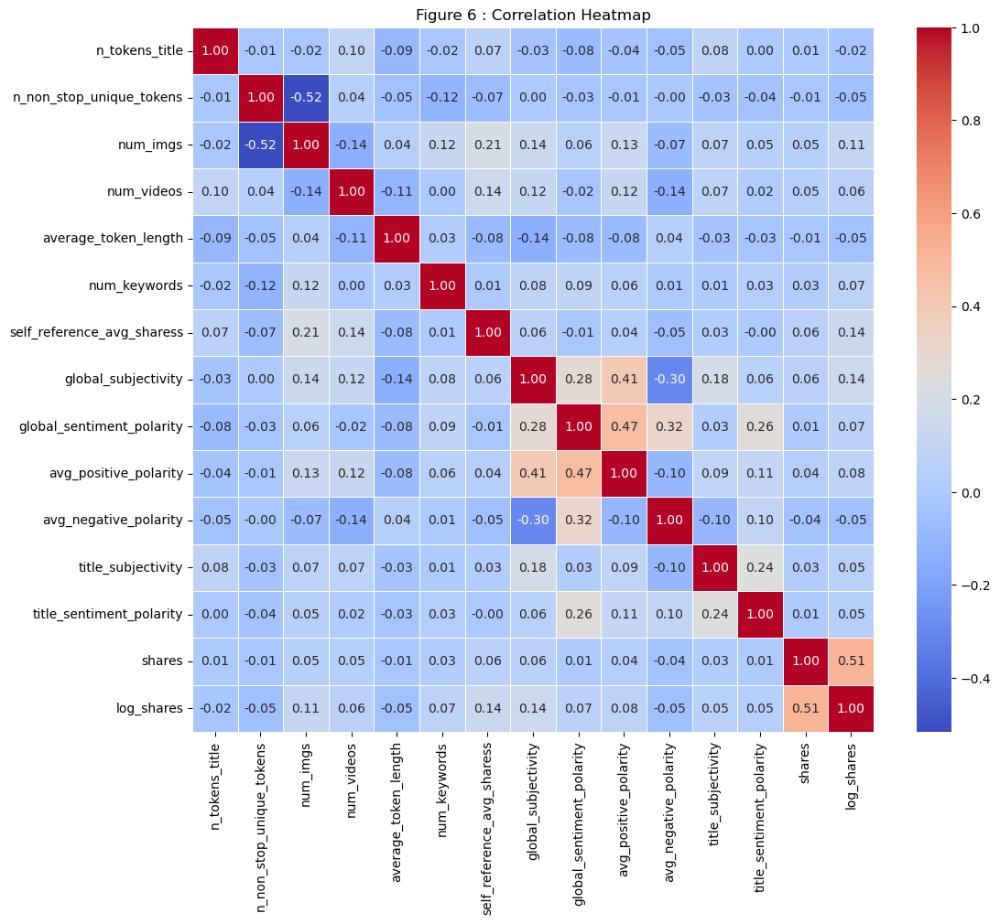

In [32]:
# Plot the correlation heatmap
correlation_matrix = mashable_upd.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=.5)
plt.title("Figure 6 : Correlation Heatmap")
plt.show()

In [33]:
correlation_matrix = mashable_upd.corr()

# Set a threshold for correlation
threshold = 0.50

highly_correlated_columns = correlation_matrix[abs(correlation_matrix) > threshold].stack().index.tolist()

# Print the list of highly correlated columns
print("Highly correlated columns:")
for col1, col2 in highly_correlated_columns:
    if col1 != col2:
        print(f"{col1} and {col2}: {correlation_matrix.loc[col1, col2]}")

Highly correlated columns:
n_non_stop_unique_tokens and num_imgs: -0.5165737601846255
num_imgs and n_non_stop_unique_tokens: -0.5165737601846255
shares and log_shares: 0.5118496384833567
log_shares and shares: 0.5118496384833567


Outliers were removed from 'n_non_stop_unique_tokens' to enhance data normality for improved analysis, aligning with the goal of creating a more reliable dataset.

In [34]:
#remove outliers for n_non_stop_unique_tokens

n_non_stop_unique_tokens_Q1 = mashable_upd['n_non_stop_unique_tokens'].quantile(0.25)
n_non_stop_unique_tokens_Q3 = mashable_upd['n_non_stop_unique_tokens'].quantile(0.75)
n_non_stop_unique_tokens_IQR = n_non_stop_unique_tokens_Q3 - n_non_stop_unique_tokens_Q1

min_tokens = n_non_stop_unique_tokens_Q1 - 1.5 * n_non_stop_unique_tokens_IQR
max_tokens = n_non_stop_unique_tokens_Q3 + 1.5 * n_non_stop_unique_tokens_IQR

# Filtering the DataFrame
mashable_upd = mashable_upd[(mashable_upd['n_non_stop_unique_tokens'] >= 
                            min_tokens) & 
                             (mashable_upd['n_non_stop_unique_tokens'] <= 
                              max_tokens)]

# Display summary statistics
print(mashable_upd['n_non_stop_unique_tokens'].describe())

count    35487.000000
mean         0.687267
std          0.084347
min          0.453880
25%          0.631267
50%          0.688761
75%          0.745342
max          0.918367
Name: n_non_stop_unique_tokens, dtype: float64


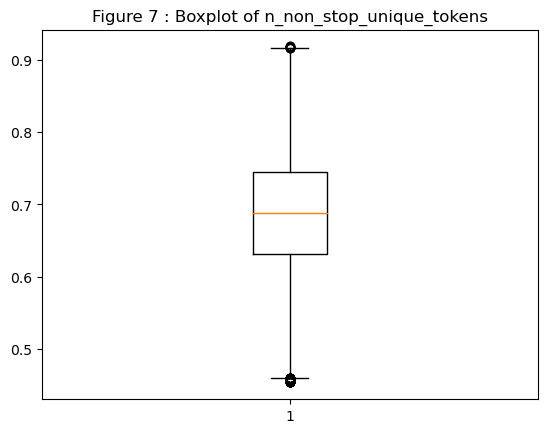

In [35]:
# Boxplot for 'n_non_stop_unique_tokens'
plt.boxplot(mashable_upd['n_non_stop_unique_tokens'])
plt.title('Figure 7 : Boxplot of n_non_stop_unique_tokens')
plt.show()

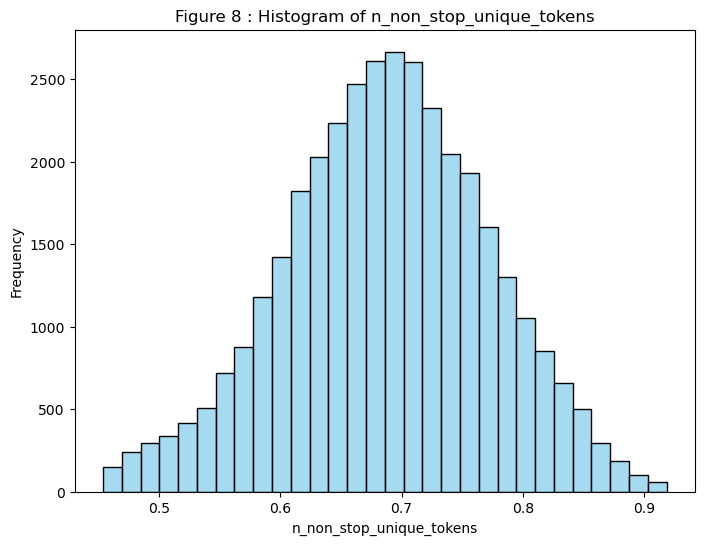

In [36]:
plt.figure(figsize=(8, 6))
sns.histplot(mashable_upd['n_non_stop_unique_tokens'], bins=30, kde=False, color='skyblue', edgecolor='black')

plt.title('Figure 8 : Histogram of n_non_stop_unique_tokens')
plt.xlabel('n_non_stop_unique_tokens')
plt.ylabel('Frequency')

plt.show()

## <a id='des'><font color=black><center>3. Descriptive and Exploratory Data Analysis</center></font></a>

Following the completion of data preparation, we are now poised to initiate descriptive and exploratory analyses. As per the earlier definition, our initial focus is to assess the significance of a news article’s individual characteristics concerning how much an article is being shared by its readers.

#### Articles Distribution -Weekdays by Channels

In the first plot, we explore the distribution of articles across weekdays, categorised by channels. Business, technology, lifestyle, and world-related articles consistently peak in releases around mid-week, with Wednesday being the most prominent day. In contrast, categories like "other" and "Social Media" exhibit either two peaks or a gradual decline since Monday. "Social Media" and "Lifestyle" have comparatively the lowest number of articles released throughout the week. A common trend across all genres is the exponential decline in the release of articles from Friday through Sunday.

<Figure size 2500x1400 with 0 Axes>

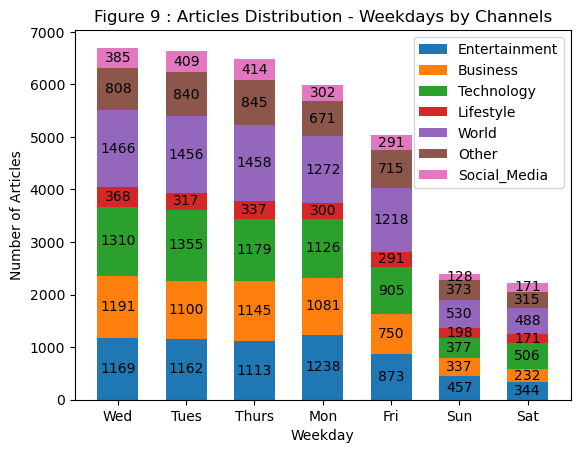

In [37]:
# Get the order of weekdays based on the total number of articles
weekday_order = mashable_upd['weekday'].value_counts().index

plt.figure(figsize=(25, 14))

fig, ax = plt.subplots()
bottom = np.zeros(7)
width = 0.6  # Define the width of the bars

for channel in mashable_upd['channel'].unique():
    subset = mashable_upd[mashable_upd['channel'] == channel]
    counts = subset['weekday'].value_counts().reindex(weekday_order, fill_value=0)
    p = ax.bar(counts.index, counts, width, label=channel, bottom=bottom)
    bottom += counts
    
    ax.bar_label(p, label_type='center')

plt.title('Figure 9 : Articles Distribution - Weekdays by Channels')
plt.xlabel('Weekday')
plt.ylabel('Number of Articles')
ax.legend()

plt.show()

#### Number of Articles in Different Channel
The second plot illustrates Mashable's article publication over two years. World-related articles lead with around 8000 publications, followed by technology, entertainment, business, other, and social media. Lifestyle articles are the least, totalling approximately 2000.

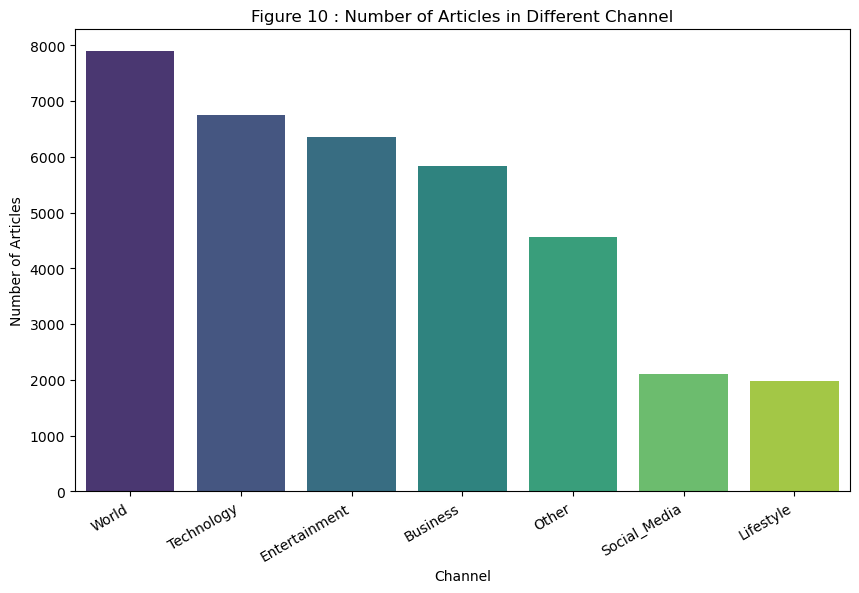

In [38]:
# Get the order of channels based on the number of articles
channel_order = mashable_upd['channel'].value_counts().index

plt.figure(figsize=(10, 6))
sns.countplot(x='channel', data=mashable_upd, palette='viridis', order=channel_order)
plt.title('Figure 10 : Number of Articles in Different Channel')
plt.xlabel('Channel')
plt.ylabel('Number of Articles')
plt.xticks(rotation=30, ha='right')
plt.show()


#### Exploring Log Shares Across Channels on Different Weekdays
The third plot is a box plot of the log shares for different channels across various days. It shows a consistent average number of shares for each category daily. All channels have upper outliers, signifying exceptionally high shares. Notably, only entertainment, business, technology, and world channels have lower outliers, indicating below-average shares on specific days.

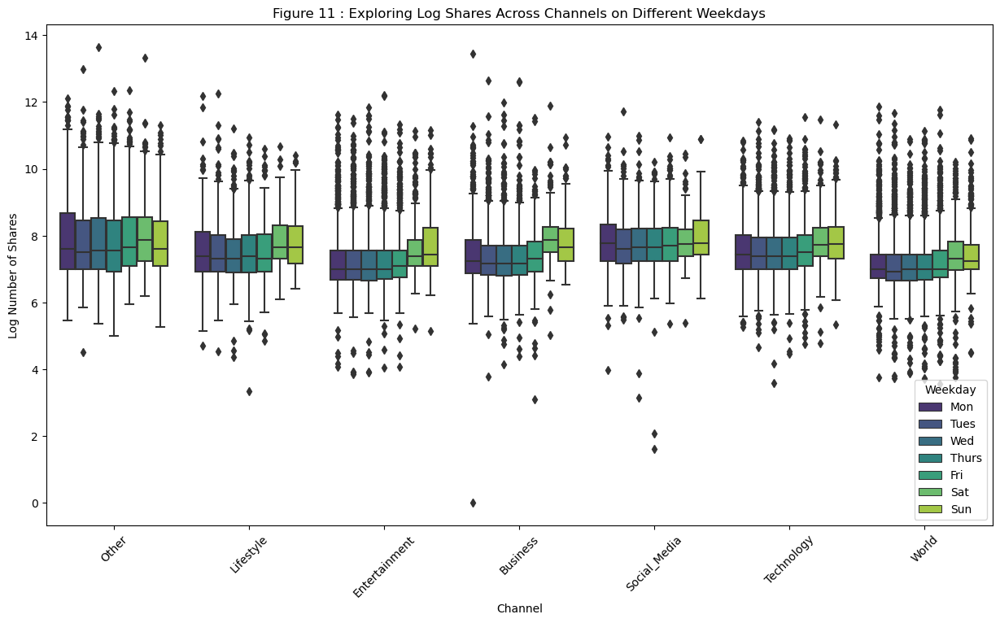

In [39]:
# Plot 3
plt.figure(figsize=(15, 8))
sns.boxplot(x='channel', y='log_shares', hue='weekday', 
            data=mashable_upd, palette='viridis')
plt.title('Figure 11 : Exploring Log Shares Across Channels on Different Weekdays')
plt.xlabel('Channel')
plt.ylabel('Log Number of Shares')
plt.legend(title='Weekday')
plt.xticks(rotation=45)
plt.show()


### Log Shares vs. Article Subjectivity across Various Channels
In the fourth plot, we examine the log number of shares relative to the subjectivity of articles across different channels. Notably, "World" related articles consistently attract 6-8 shares, displaying subjectivity levels within the range of 0.1 to 0.5. Conversely, articles from "Other" channels exhibit higher average subjectivity (above 0.6) and log a greater number of shares, ranging from 6 to 10 on average. The remaining channels showcase an average article subjectivity spanning from 0.2 to 0.8, with an accompanying average log number of shares ranging from 4 to 10.

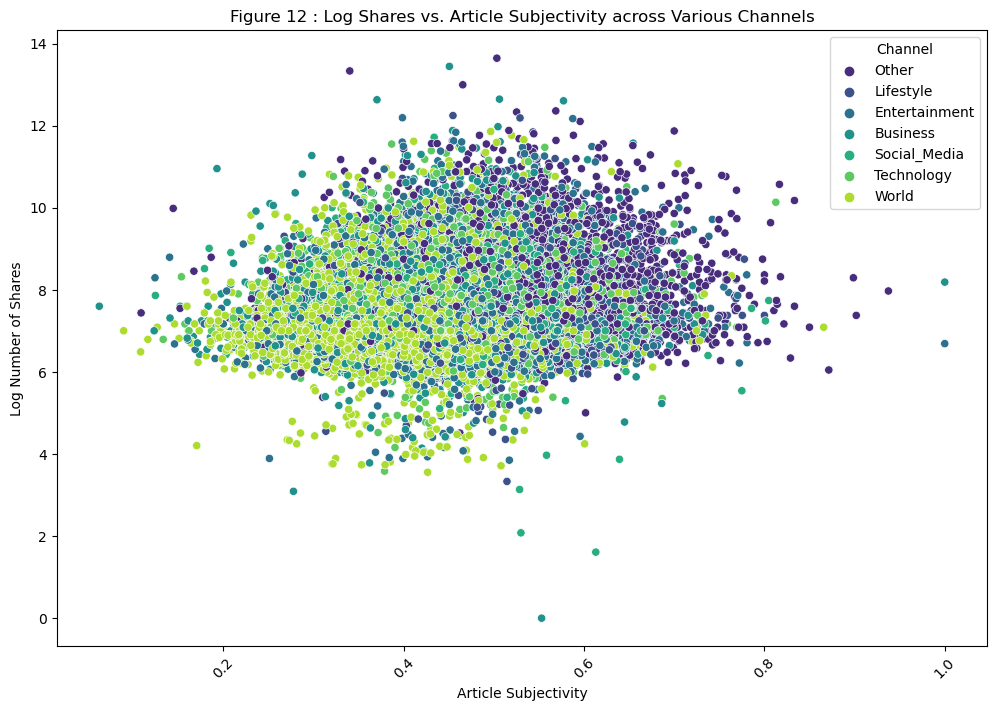

In [40]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='global_subjectivity', y='log_shares', hue='channel', 
                data=mashable_upd, palette='viridis')
plt.title('Figure 12 : Log Shares vs. Article Subjectivity across Various Channels')
plt.xlabel('Article Subjectivity')
plt.ylabel('Log Number of Shares')
plt.xticks(rotation=45)
plt.legend(title='Channel')
plt.show()


### Log Shares vs. Article Sentiment Polarity across Various Channels
In the fifth graph, log shares are analysed concerning article sentiment polarity across weekdays. World articles average 4-8 shares with sentiment polarity from -0.4 to 0.2. Other channels show a more even spread, averaging 4-12 shares with sentiment polarity ranging from -0.2 to 0.4.

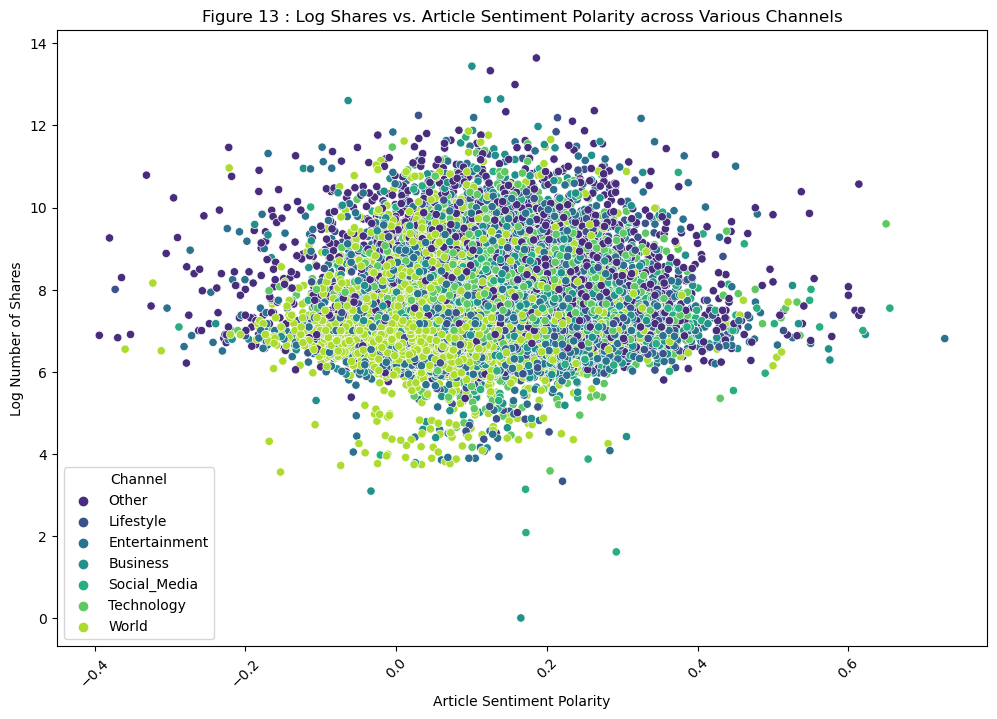

In [41]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='global_sentiment_polarity', y='log_shares', hue='channel', data=mashable_upd, palette='viridis')
plt.title('Figure 13 : Log Shares vs. Article Sentiment Polarity across Various Channels')
plt.xlabel('Article Sentiment Polarity')
plt.ylabel('Log Number of Shares')
plt.xticks(rotation=45)
plt.legend(title='Channel')
plt.show()

## <a id='pred'><font color=black><center>4. Predictive Models</center></font></a>

To predict the variable of interest, various models, including poly linear regression and decision tree, will be implemented, considering selective features. We'll proceed with random forest, gradient boost, SVM, and Grid Search, assessing and comparing their predictive power to evaluate performance quality. This process will enable well-founded recommendations for Mashable, aiming to increase platform shares.

### <a id='libraries'><font color=black>4.1 Importing ML Libraries</font></a>

In [42]:
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor, export_text
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

### <a id='LRM'><font color=black>4.2 Model #1 - Linear Regression Model</font></a>

In [43]:
#Remove shares variable from dataset - mashable_upd
variables_to_remove = ['shares']
mashable_upd = mashable_upd.drop(variables_to_remove, axis=1)

In [44]:
mashable_upd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35487 entries, 0 to 39643
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   n_tokens_title              35487 non-null  float64 
 1   n_non_stop_unique_tokens    35487 non-null  float64 
 2   num_imgs                    35487 non-null  float64 
 3   num_videos                  35487 non-null  float64 
 4   average_token_length        35487 non-null  float64 
 5   num_keywords                35487 non-null  float64 
 6   self_reference_avg_sharess  35487 non-null  float64 
 7   global_subjectivity         35487 non-null  float64 
 8   global_sentiment_polarity   35487 non-null  float64 
 9   avg_positive_polarity       35487 non-null  float64 
 10  avg_negative_polarity       35487 non-null  float64 
 11  title_subjectivity          35487 non-null  float64 
 12  title_sentiment_polarity    35487 non-null  float64 
 13  weekday         

Encoding categorical variables, engineers polynomial features, and fits a second-degree Polynomial Linear Regression model.


In [45]:
#Use mashable_final for performing modelling for every model by copying from 
#mashable_upd
mashable_final = mashable_upd.copy()

# Identifying numeric and categorical columns
numeric_cols = mashable_final.select_dtypes(include=['number']).columns 
categorical_cols = mashable_final.select_dtypes(include=['category']).columns

# Creating imputers for numeric and categorical columns
numeric_imputer = SimpleImputer(strategy='mean') 
categorical_imputer = SimpleImputer(strategy='most_frequent')

# Fit and transform the imputers on respective columns
mashable_final[numeric_cols] = numeric_imputer.fit_transform(mashable_final[numeric_cols]) 

mashable_final[categorical_cols] = categorical_imputer.fit_transform(mashable_final[categorical_cols])

                                                                                                                                                    # Encoding categorical variables
label_encoders = {}                                                                     
for col in categorical_cols:
    label_encoder = LabelEncoder()
    mashable_final[col] = label_encoder.fit_transform(mashable_final[col])
    label_encoders[col] = label_encoder




# Split the data into features (X) and target variable (y)
X = mashable_final.drop('log_shares', axis=1)
y = mashable_final['log_shares']

# Feature engineering: Adding polynomial features
degree = 2
poly = PolynomialFeatures(degree=degree)
X_poly = poly.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = make_pipeline(LinearRegression())

# Fit the model on the training data
model.fit(X_train, y_train)

# Predict on the test set
predictions = model.predict(X_test)

# Evaluate the model
mse_LR = mean_squared_error(y_test, predictions)
rmse_LR = np.sqrt(mse_LR)
mae_LR = mean_absolute_error(y_test, predictions)
r2_LR = r2_score(y_test, predictions)

print(f"Root Mean Squared Error(RMSE) Linear Regression Full Set: {rmse_LR}")
print(f"R-squared Linear Regression Full Set: {r2_LR}")
print(f'Mean Absolute Error Linear Regression Full Set: {mae_LR}')

Root Mean Squared Error(RMSE) Linear Regression Full Set: 0.8691152170320513
R-squared Linear Regression Full Set: 0.10601531670115183
Mean Absolute Error Linear Regression Full Set: 0.6531303908518531


In [46]:
#Below code performs feature selection on Polynomial Linear Regression Model.


features = ['self_reference_avg_sharess', 'global_subjectivity', 
            'average_token_length', 
            'n_non_stop_unique_tokens', 'avg_positive_polarity',
            'global_sentiment_polarity',
            'log_shares','weekday','channel','num_imgs','num_videos'
           ]

mashable_final = mashable_upd[features].copy()

# Identifying numeric and categorical columns
numeric_cols = mashable_final.select_dtypes(include=['number']).columns 
categorical_cols = mashable_final.select_dtypes(include=['category']).columns

# Creating imputers for numeric and categorical columns
numeric_imputer = SimpleImputer(strategy='mean') 
categorical_imputer = SimpleImputer(strategy='most_frequent')

# Fit and transform the imputers on respective columns
mashable_final[numeric_cols] = numeric_imputer.fit_transform(
    mashable_final[numeric_cols]) 

mashable_final[categorical_cols] = categorical_imputer.fit_transform(
    mashable_final[categorical_cols])

                                                                                                                                                    # Encoding categorical variables
label_encoders = {}                                                                     
for col in categorical_cols:
    label_encoder = LabelEncoder()
    mashable_final[col] = label_encoder.fit_transform(mashable_final[col])
    label_encoders[col] = label_encoder




# Split the data into features (X) and target variable (y)
X = mashable_final.drop('log_shares', axis=1)
y = mashable_final['log_shares']

# Feature engineering: Adding polynomial features
degree = 2
poly = PolynomialFeatures(degree=degree)
X_poly = poly.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = make_pipeline(LinearRegression())

# Fit the model on the training data
model.fit(X_train, y_train)

# Predict on the test set
predictions = model.predict(X_test)

# Evaluate the model
mse_LRS = mean_squared_error(y_test, predictions)
rmse_LRS = np.sqrt(mse_LRS)
mae_LRS = mean_absolute_error(y_test, predictions)
r2_LRS = r2_score(y_test, predictions)

print(f"Root Mean Squared Error(RMSE) Linear Regression Selected Set: {rmse_LRS}")
print(f"R-squared Linear Regression selected Set: {r2_LRS}")
print(f'Mean Absolute Error Linear Regression selected Set: {mae_LRS}')

Root Mean Squared Error(RMSE) Linear Regression Selected Set: 0.870969508188475
R-squared Linear Regression selected Set: 0.10219654503114595
Mean Absolute Error Linear Regression selected Set: 0.6551068764878812


### <a id='DT'><font color=black>4.3 Model #2 - Decision Tree Model</font></a>

In [47]:
# Perform One-hot encoding for Channel and Weekday 

mashable_duplicate = mashable_upd.copy()

In [48]:
# Assuming df is your DataFrame and 'weekday' is the column to be encoded
le = LabelEncoder()
mashable_duplicate['weekday_encoded'] = le.fit_transform(
    mashable_duplicate['weekday'])
mashable_duplicate['channel_encoded'] = le.fit_transform(
    mashable_duplicate['channel'])

mashable_duplicate = pd.get_dummies(mashable_duplicate, columns=['weekday', 'channel'], 
                                  prefix=['weekday', 'channel'])



# Assuming df is your DataFrame and 'variable1', 'variable2', ... are the columns to be removed
variables_to_remove = ['weekday_encoded','channel_encoded']
mashable_updated = mashable_duplicate.drop(variables_to_remove, axis=1)



In [49]:
mashable_updated.head()

,n_tokens_title,n_non_stop_unique_tokens,num_imgs,num_videos,average_token_length,num_keywords,self_reference_avg_sharess,global_subjectivity,global_sentiment_polarity,avg_positive_polarity,...,weekday_Fri,weekday_Sat,weekday_Sun,channel_Other,channel_Lifestyle,channel_Entertainment,channel_Business,channel_Social_Media,channel_Technology,channel_World
0,12.0,0.815385,0.693147,0.0,1.737016,5.0,6.208590,0.521617,0.092562,0.378636,...,0,0,0,0,0,1,0,0,0,0
1,9.0,0.791946,0.693147,0.0,1.777276,4.0,0.000000,0.341246,0.148948,0.286915,...,0,0,0,0,0,0,1,0,0,0
2,9.0,0.663866,0.693147,0.0,1.685169,6.0,6.823286,0.702222,0.323333,0.495833,...,0,0,0,0,0,0,1,0,0,0
3,9.0,0.665635,0.693147,0.0,1.687305,7.0,0.000000,0.429850,0.100705,0.385965,...,0,0,0,0,0,1,0,0,0,0
4,13.0,0.540890,3.044522,0.0,1.737450,7.0,8.055843,0.513502,0.281003,0.411127,...,0,0,0,0,0,0,0,0,1,0


The code utilizes a decision tree regressor on the 'mashable_updated' DataFrame,
visualizes the tree, predicts on the test set, and evaluates the model.

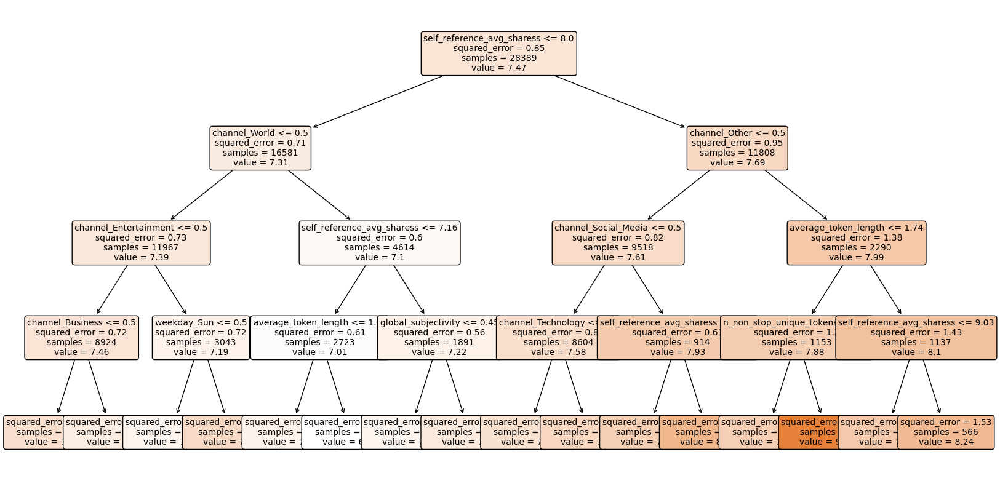

In [50]:
mashable_final = mashable_updated.copy()

# Split the dataset into training and testing sets
train_data, test_data, train_target, test_target = train_test_split(mashable_final.drop('log_shares', axis=1),
                                                                    mashable_final['log_shares'], test_size=0.2, 
                                                                    random_state=42)

# Initialize the decision tree regressor
dt_regressor = DecisionTreeRegressor(max_depth = 4, random_state=42)

# Fit the model on the training data
dt_regressor.fit(train_data, train_target)

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(dt_regressor, filled=True, 
          feature_names=train_data.columns.tolist(),rounded=True, 
          precision=2, fontsize=10)  # Convert column names to list
plt.show()



predictions = dt_regressor.predict(test_data)

# Calculate R-squared
r2_dt = r2_score(test_target, predictions)

# Calculate MSE, RMSE, and MAE
mse_dt = mean_squared_error(test_target, predictions)
rmse_dt = np.sqrt(mse_dt)
mae_dt = mean_absolute_error(test_target, predictions)


In [51]:
# Print the results
print("R-squared Decision Tree:", r2_dt)
print("Root Mean Squared Error (RMSE) Decision Tree:", rmse_dt)
print("Mean Absolute Error (MAE) Decision Tree:", mae_dt)

R-squared Decision Tree: 0.09021228862560138
Root Mean Squared Error (RMSE) Decision Tree: 0.8767632707149177
Mean Absolute Error (MAE) Decision Tree: 0.6595386513447486


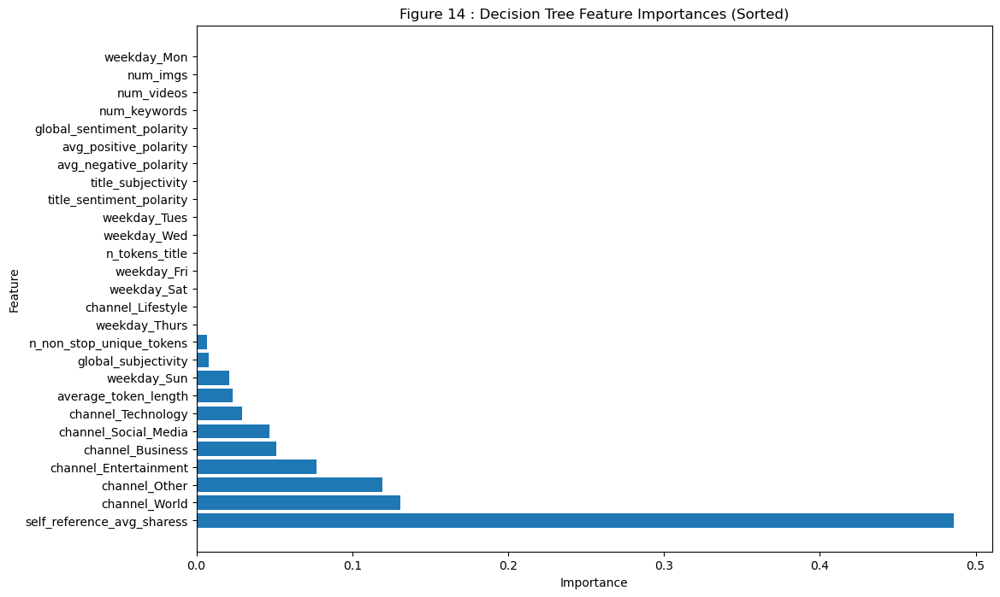

In [52]:
# Get feature importances
feature_importances = dt_regressor.feature_importances_
feature_names = train_data.columns.tolist()

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names,
                                      'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance',
                                                          ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.title('Figure 14 : Decision Tree Feature Importances (Sorted)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

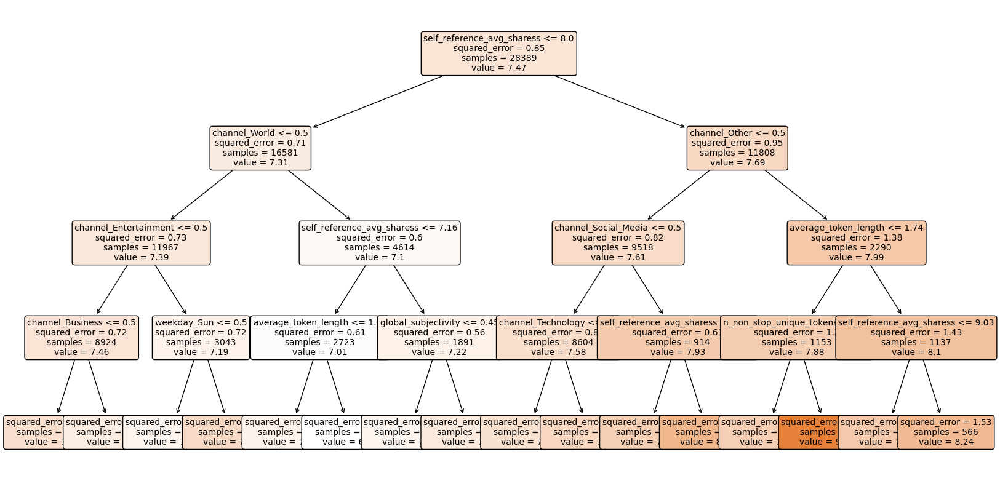

R-squared Decision Tree: 0.09021228862560138
Root Mean Squared Error (RMSE) Decision Tree: 0.8767632707149177
Mean Absolute Error (MAE) Decision Tree: 0.6595386513447486


In [53]:
# Feature selection on above decision tree
mashable_final = mashable_updated.copy()


feature_cols =['self_reference_avg_sharess','channel_World','channel_Other',
              'channel_Entertainment','channel_Business','channel_Social_Media',
              'channel_Technology','average_token_length','weekday_Sun']

X = mashable_final[feature_cols]
y = mashable_final['log_shares']
train_data, test_data, train_target, 
test_target = train_test_split(X, y, test_size=0.2, random_state=42)



# Split the dataset into training and testing sets
train_data, test_data, train_target, test_target = train_test_split(
    mashable_final.drop('log_shares', axis=1), mashable_final['log_shares'], 
    test_size=0.2, random_state=42)

# Initialize the decision tree regressor
dt_regressor = DecisionTreeRegressor(max_depth = 4, random_state=42)

# Fit the model on the training data
dt_regressor.fit(train_data, train_target)

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(dt_regressor, filled=True,feature_names=train_data.columns.tolist(),rounded=True, precision=2, fontsize=10)  # Convert column names to list
plt.show()



predictions = dt_regressor.predict(test_data)

# Calculate R-squared
r2_dt2 = r2_score(test_target, predictions)

# Calculate MSE, RMSE, and MAE
mse_dt2 = mean_squared_error(test_target, predictions)
rmse_dt2 = np.sqrt(mse_dt2)
mae_dt2 = mean_absolute_error(test_target, predictions)


# Print the results
print("R-squared Decision Tree:", r2_dt2)
print("Root Mean Squared Error (RMSE) Decision Tree:", rmse_dt2)
print("Mean Absolute Error (MAE) Decision Tree:", mae_dt2)


### <a id='RF'><font color=black>4.4 Model #3 - Random Forest Model</font></a>

Random Forest regressor to the 'mashable_updated' DataFrame, featuring training/test set splitting, model fitting, test set prediction, feature importance analysis, and evaluation metrics printing.

Root Mean Squared Error (RMSE): 0.8642164831877678
Feature Importances:
                       Feature  Importance
6   self_reference_avg_sharess    0.120678
1     n_non_stop_unique_tokens    0.097384
4         average_token_length    0.092875
7          global_subjectivity    0.090552
8    global_sentiment_polarity    0.087624
9        avg_positive_polarity    0.084911
10       avg_negative_polarity    0.083503
0               n_tokens_title    0.044326
12    title_sentiment_polarity    0.043255
2                     num_imgs    0.042397
5                 num_keywords    0.038415
11          title_subjectivity    0.035520
3                   num_videos    0.025464
26               channel_World    0.014264
20               channel_Other    0.011815
22       channel_Entertainment    0.010405
18                 weekday_Sat    0.009980
19                 weekday_Sun    0.009332
13                 weekday_Mon    0.008160
15                 weekday_Wed    0.007659
14                weekday

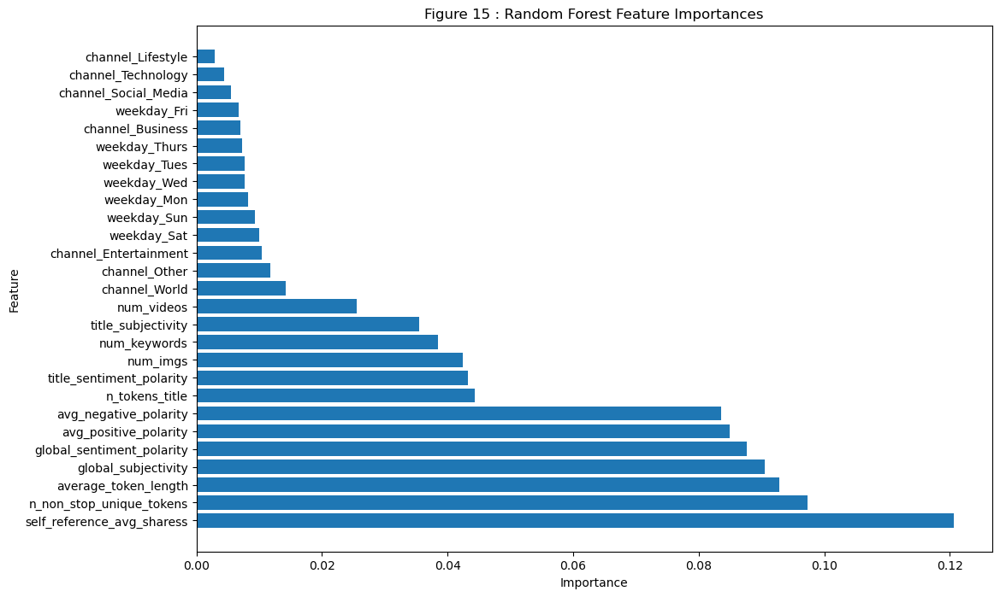

R-squared Decision Tree Feature Selection: 0.11606473431628361
Root Mean Squared Error (RMSE)Decision Tree Feature Selection: 0.8642164831877678
Mean Absolute Error (MAE) Decision Tree Feature Selection: 0.6511502167306286


In [54]:
mashable_final = mashable_updated.copy()

# Split the dataset into training and testing sets
train_data, test_data, train_target, test_target = train_test_split(mashable_final.drop('log_shares', axis=1), 
                                                                    mashable_final['log_shares'], test_size=0.2, 
                                                                    random_state=42)


# Initialize the Random Forest regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf_regressor.fit(train_data, train_target)

# Predict on the test set
predictions = rf_regressor.predict(test_data)

# Evaluate the model
mse = mean_squared_error(test_target, predictions)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Feature importances
feature_importances = rf_regressor.feature_importances_
# Assuming you have a DataFrame for better visualization
feature_importance_df = pd.DataFrame({'Feature': train_data.columns,
                                      'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', 
                                                          ascending=False)
print("Feature Importances:")
print(feature_importance_df)

# Optionally, you can visualize the feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.title('Figure 15 : Random Forest Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Calculate R-squared
r2_rf = r2_score(test_target, predictions)

# Calculate MSE, RMSE, and MAE
mse_rf = mean_squared_error(test_target, predictions)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(test_target, predictions)


# Print the results
print("R-squared Decision Tree Feature Selection:", r2_rf)
print("Root Mean Squared Error (RMSE)Decision Tree Feature Selection:", rmse_rf)
print("Mean Absolute Error (MAE) Decision Tree Feature Selection:", mae_rf)

### <a id='GB'><font color=black>4.5 Model #4 - Gradient Boost Model</font></a>

Gradient Boosting regressor to the training data, makes predictions on the test set

In [55]:
mashable_final = mashable_updated.copy()

# Split the dataset into training and testing sets
train_data, test_data, train_target, test_target = train_test_split(mashable_final.drop('log_shares', axis=1), 
                                                                    mashable_final['log_shares'], test_size=0.2, 
                                                                    random_state=42)

# Create a Gradient Boosting regression model
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
gb_model.fit(train_data, train_target)

# Predict on the test set
gb_predictions = gb_model.predict(test_data)

# Evaluate the model
r2_gb = r2_score(test_target, gb_predictions)


# Calculate MSE, RMSE, and MAE
mse_gb = mean_squared_error(test_target, gb_predictions)
rmse_gb = np.sqrt(mse_gb)
mae_gb = mean_absolute_error(test_target, gb_predictions)


# Print the results
print("R-squared Gradient Boost Selection:", r2_gb)
print("Root Mean Squared Error (RMSE)Gradient Boost:", rmse_gb)
print("Mean Absolute Error (MAE) Gradient Boost:", mae_gb)


R-squared Gradient Boost Selection: 0.13361264716865495
Root Mean Squared Error (RMSE)Gradient Boost: 0.8555952540095823
Mean Absolute Error (MAE) Gradient Boost: 0.6393829177982306


In [56]:
# Get feature importances
feature_importances_gb = gb_model.feature_importances_

# Create a DataFrame for better visualization
feature_importance_df_gb = pd.DataFrame({'Feature': train_data.columns,
                                         'Importance': feature_importances_gb})
feature_importance_df_gb = feature_importance_df_gb.sort_values(by='Importance',
                                                                ascending=False)

# Print or visualize the feature importances
print("Feature Importances for Gradient Boosting:")
print(feature_importance_df_gb)

Feature Importances for Gradient Boosting:
                       Feature  Importance
6   self_reference_avg_sharess    0.322647
26               channel_World    0.084832
2                     num_imgs    0.075310
22       channel_Entertainment    0.064067
20               channel_Other    0.061246
7          global_subjectivity    0.046101
18                 weekday_Sat    0.046066
19                 weekday_Sun    0.040612
24        channel_Social_Media    0.038916
1     n_non_stop_unique_tokens    0.038406
4         average_token_length    0.035461
5                 num_keywords    0.023102
8    global_sentiment_polarity    0.020681
3                   num_videos    0.019275
23            channel_Business    0.017364
10       avg_negative_polarity    0.016639
9        avg_positive_polarity    0.011412
12    title_sentiment_polarity    0.011147
25          channel_Technology    0.007664
11          title_subjectivity    0.006763
0               n_tokens_title    0.004285
15         

### <a id='GS'><font color=black>4.6 Model #5 - SVM and GridSearch Model</font></a>

Support Vector Regression with standardization to the training data, predicts on the test set.

In [57]:
mashable_final = mashable_updated.copy()

# Split the dataset into training and testing sets
train_data, test_data, train_target, test_target = train_test_split(mashable_final.drop('log_shares', axis=1), 
                                                                    mashable_final['log_shares'], test_size=0.2, 
                                                                    random_state=42)

# Standardize features for SVR
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_data)
X_test_scaled = scaler.transform(test_data)

# Create an SVR model
svr_model = SVR()

# Fit the model on the scaled training data
svr_model.fit(X_train_scaled, train_target)

# Predict on the scaled test set
svr_predictions = svr_model.predict(X_test_scaled)

# Evaluate the model
r2_svr = r2_score(test_target, svr_predictions)
print(f"R-squared SVR: {r2_svr}")

# Calculate MSE, RMSE, and MAE
mse_svr = mean_squared_error(test_target, svr_predictions)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(test_target, svr_predictions)


# Print the results
print("R-squared Support Vector Machine:", r2_svr)
print("Root Mean Squared Error (RMSE)Support Vector Machine:", rmse_svr)
print("Mean Absolute Error (MAE) Support Vector Machine:", mae_svr)


R-squared SVR: 0.0876353277173072
R-squared Support Vector Machine: 0.0876353277173072
Root Mean Squared Error (RMSE)Support Vector Machine: 0.8780041024986778
Mean Absolute Error (MAE) Support Vector Machine: 0.626765604026907


Grid search to optimize SVR hyperparameters, fits the best model to the training data, predicts on the test set.

The Grid Search algorithm takes hours to run as it searches for determinators. Therefore, in the notebook, we've marked the following code (2 cells) as markdown. Performance indicators are specified in the code cell below, using default values from the previous results mentioned in the PDF (see GridSearchResults.png).




mashable_final = mashable_updated.copy()

# Split the dataset into training and testing sets
train_data, test_data, train_target, test_target = train_test_split(mashable_final.drop('log_shares', axis=1), 
                                                                    mashable_final['log_shares'], 
                                                                    test_size=0.2, random_state=42)


# Standardize features for SVR
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train_data)
X_test_scaled = scaler.transform(test_data)

# Define the parameter grid
param_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10],
    'epsilon': [0.1, 0.2, 0.5]
}


# Create SVR model
svr = SVR()

# Perform GridSearchCV
grid_search = GridSearchCV(svr, param_grid, scoring='r2', cv=5)
grid_search.fit(X_train_scaled, train_target)

# Get the best parameters
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")

# Use the best model for predictions
best_svr = grid_search.best_estimator_
svr_predictions = best_svr.predict(X_test_scaled)

# Evaluate the model
r2_svr2 = r2_score(test_target, svr_predictions)
mse_svr2 = mean_squared_error(test_target, svr_predictions)
rmse_svr2 = np.sqrt(mse_svr2)
mae_svr2 = mean_absolute_error(test_target, svr_predictions)

# Print the results
print("R-squared Grid Search:", r2_svr2)
print("Root Mean Squared Error (RMSE)Grid Search:", rmse_svr2)
print("Mean Absolute Error (MAE) Grid Search", mae_svr2)

In [58]:
#Assign default value 

# Check if the variable is defined
try:
    # If defined, use the variable
    r2_svr2
except NameError:
    # If not defined, assign a default value
    r2_svr2 = 0.11795615218724043

try:
    # If defined, use the variable
    rmse_svr2
except NameError:
    # If not defined, assign a default value
    rmse_svr2 = 0.8632913759345118
    
try:
    # If defined, use the variable
    mae_svr2
except NameError:
    # If not defined, assign a default value
    mae_svr2 = 0.6309417667485238
from IPython.display import Image 
Image("GridSearchResults.png")

    
# Print the results
print("R-squared Grid Search:", r2_svr2)
print("Root Mean Squared Error (RMSE)Grid Search:", rmse_svr2)
print("Mean Absolute Error (MAE) Grid Search", mae_svr2)


R-squared Grid Search: 0.11795615218724043
Root Mean Squared Error (RMSE)Grid Search: 0.8632913759345118
Mean Absolute Error (MAE) Grid Search 0.6309417667485238


### <a id='insights'><font color=black>4.7 Evaluation and Insights</font></a>

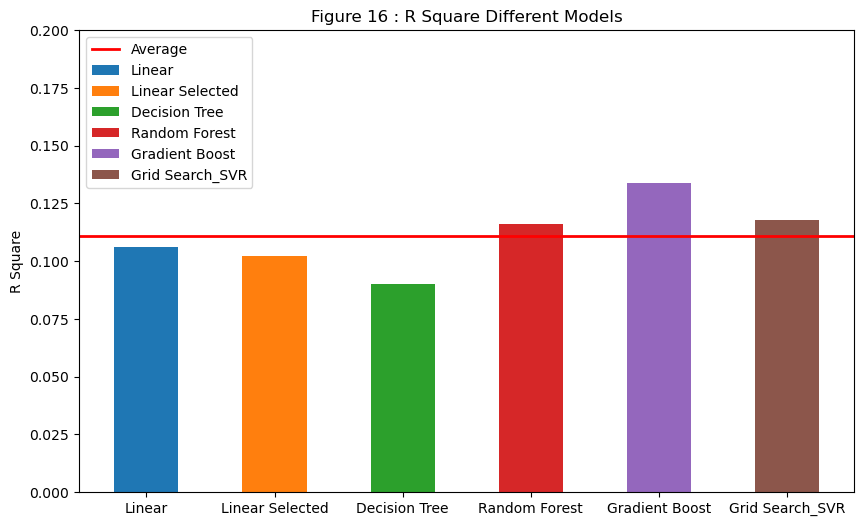

In [59]:
r2_data = np.array([r2_LR, r2_LRS, r2_dt , r2_rf, r2_gb, r2_svr2])
average_line = np.mean(r2_data)

models = ["Linear", "Linear Selected", "Decision Tree",
          "Random Forest","Gradient Boost", "Grid Search_SVR"]
bar_width = 0.5

fig, ax = plt.subplots(figsize=(10, 6))

for i, model in enumerate(models):
    ax.bar(i, r2_data[i], bar_width, label=model)

ax.axhline(y=average_line, color="red", linewidth=2, label="Average")
ax.set_ylim(0, 0.2)
ax.set_ylabel("R Square")
ax.set_title("Figure 16 : R Square Different Models")
ax.set_xticks(np.arange(len(models)))
ax.set_xticklabels(models)
ax.legend()

plt.show()

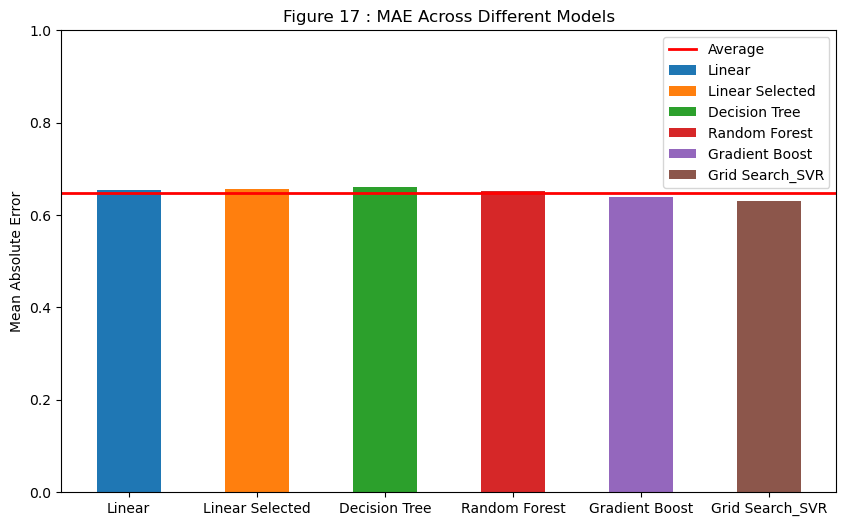

In [60]:
mae_data = np.array([mae_LR, mae_LRS, mae_dt ,mae_rf, mae_gb, mae_svr2])

average_line = np.mean(mae_data)

models = ["Linear", "Linear Selected", "Decision Tree", "Random Forest",
          "Gradient Boost", "Grid Search_SVR"]
bar_width = 0.5

fig, ax = plt.subplots(figsize=(10, 6))

for i, model in enumerate(models):
    ax.bar(i, mae_data[i], bar_width, label=model)

ax.axhline(y=average_line, color="red", linewidth=2, label="Average")
ax.set_ylim(0, 1.0)
ax.set_ylabel("Mean Absolute Error")
ax.set_title("Figure 17 : MAE Across Different Models")
ax.set_xticks(np.arange(len(models)))
ax.set_xticklabels(models)
ax.legend()

plt.show()

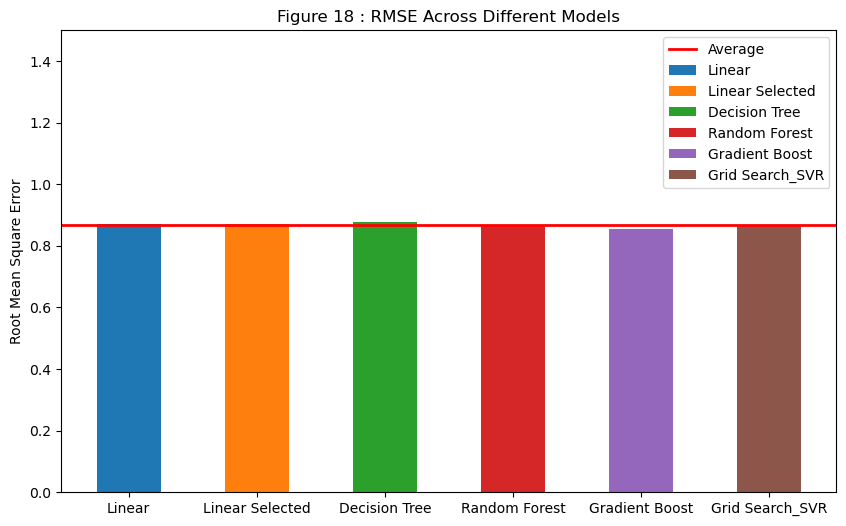

In [61]:
#RMSE Across Different 6 Models
rmse_data = np.array([rmse_LR, rmse_LRS, rmse_dt ,rmse_rf, rmse_gb, rmse_svr2])

average_line = np.mean(rmse_data)

models = ["Linear", "Linear Selected", "Decision Tree", "Random Forest",
          "Gradient Boost", "Grid Search_SVR"]
bar_width = 0.5

fig, ax = plt.subplots(figsize=(10, 6))

for i, model in enumerate(models):
    ax.bar(i, rmse_data[i], bar_width, label=model)

ax.axhline(y=average_line, color="red", linewidth=2, label="Average")
ax.set_ylim(0, 1.5)
ax.set_ylabel("Root Mean Square Error")
ax.set_title("Figure 18 : RMSE Across Different Models")
ax.set_xticks(np.arange(len(models)))
ax.set_xticklabels(models)
ax.legend()

plt.show()

Using a variation of models to assess the dependent variable (log-shares); Poly Linear Regression, Decision Tree, Random Forest, Gradient Boost, SVM, and Grid Search, results were obtained to evaluate their respective prediction power. Since very low R-squared results were generated from the linear regression, other models were explored to compare different statistical metrics - R-Squared, MAE and RMSE. A low R-squared is indicative of a poor performing model and thus its exhibiting predictions that deviate significantly from the actual values. These low R-squared results continued throughout the models. The R-Squared is best in the Gradient Boost method (13.36%) followed with Random Forest and Grid Search (variation of SVM), for the Poly-Linear model it is just 10.9 percent. This shows that our models generally didn’t perform well, even with identifying problems in the earlier models and trying to implement solutions i.e., gradient boost, to remedy the poor statistical results. Consequently, a different approach may be needed to improve the performance to differentiate how the dependent variable is predicted.

The models implement a feature selection method for the Poly Linear Regression and Decision Tree using features such as; 'self_reference_avg_sharess’, ‘channel’,  'global_rate_positive_words' and 'num_self_hrefs'. Since the R-squared was lowered from the original models, the feature selection is not recommended.

Firstly, the random forest enhances the performance of the decision tree by removing the drawbacks through ensemble learning (bagging). The R-squared of the decision tree was increased when the random forest model was used. Next, an alternative ensemble machine learning model was tried in the gradient boost method. This reduces overfitting by focusing on the predictions rather than training the model. Hence the R-squared was increased in comparison to the random forest. Lastly, the grid search technique improves the predictive performance by utilising hyperparamaters via cross-validation.

## <a id='con&recom'><font color=black><center>5. Conclusion and Business Recommendations</center></font></a>

### <a id='conclusion'><font color=black>5.1 Conclusion</font></a>

From analysing the results of the models above, an important observation to be noted is that the R-squared is below 15%, essentially implying that the predictions will be mostly incorrect. Weak perfromance is also implied since the MAE is more than 60% and the RMSE is more than 80%. Despite this, of all the six models, the gradient boosting method came out on top because of its a higher R-squared and lowest MAE and RMSE. A rigorous test was implemented throughout the model selection process to attempt to remedy the poor performance but to no avail. 

In conclusion, problems with the models stem from the dataset itself not from the EDA and modelling. It would be wise therefore to reassess the dataset to check for bias in the sampling, i.e., the source and collection method is not clear. This could lead to ethical concerns and thus collecting the data again may be needed. Moreover, upon the recollection, a thorough cleaning process will be needed.

### <a id='recom'><font color=black>5.2 Recommendations</font></a>

A common pattern amongst the models was the identification of the most important variable that will our aid business recommendations. This variable is 'self-reference average shares' which observes the average number of times an article referenced within an article has been shared. This implies that a referenced article is likely to increase shares. This may be because a referenced article has higher credibility and the appearance of a referenced article in multiple different articles could be seen more frequently by readers who may not necessarily read these different articles. Consequently, mashable could encourage its writers to reference other articles also written on mashable. The metric used for importance was also much higher than next largest variables, thus, alternative variables are observed to be insignificant for predicting the dependent variable which further emphasises the importance of ‘self-reference average shares’ in making predictions on the number of shares.

Furthermore, through observing the graph 'Exploring Log Shares Across Channels on Different Weekdays' (Figure 11), outliers were identified and would need to be handled. However, due to the specified contraints of of this report, this was unable to be completed.

### <a id='next'><font color=black>5.3 Next Steps</font></a>

To fully encapsulate the online news sharing landscape, an analysis on alternative news sites to mashable will need to be made. From the analysis, it was established which factors can affect the number of shares on mashable only. Conducting analysis on other sites will allow the identification of other factors that increase sharing by observing common trends amongst platforms. Moreover, obtaining further data from alternative sites will provide deeper insights that may be unidentifiable through the sole use of Mashable. These sites may help to uncover hidden patterns in the data that may have a material impact on the volume of sharing. Empirically, using a variety of sources can diminish the effects of bias (Utah State University, 2022).

## <a id='ref'><font color=black><center>6. References</center></font></a>

1. Dhiraj K (2023). Random Forest Regression in Python Using Scikit-Learn. Available at:https://www.comet.com/site/blog/random-forest-regression-in-python-using-scikit-learn/. (Accessed: 21th November 2023)

2. Kelwin F., Pedro V., Paulo Cortez., Pedro Sernadela., (2015). Online News Popularity. Available at: https://archive.ics.uci.edu/dataset/332/online+news+popularity. (Accessed: 5th November 2023)

3. Matplotlib. Bar Label Demo. Availabe at:https://matplotlib.org/stable/gallery/lines_bars_and_markers/bar_label_demo.html#sphx-glr-gallery-lines-bars-and-markers-bar-label-demo-py (Accessed: 15th November 2023)

4. The Click Reader (2021). Decision Tree Regression Explained with Implementation in Python. Available at:https://medium.com/@theclickreader/decision-tree-regression-explained-with-implementation-in-python-1e6e48aa7a47. (Accessed: 21th November 2023)

5. Utah State University (2022). Variety of Sources: This guide explains the importance of using a variety of perspectives and source types in your research. Available at: https://libguides.usu.edu/variety#:~:text=Using%20a%20variety%20of%20sources%20can%20diminish%20the%20effects%20of,with%20viewpoints%20from%20other%20sources. (Accessed: 1st December 2023)

6. “Polynomial Regression in Python.” Engineering Education (EngEd) Program | Section, www.section.io/engineering-education/polynomial-regression-in-python/.

7. “Sklearn.preprocessing.PolynomialFeatures — Scikit-Learn 0.23.2 Documentation.” Scikit-Learn.org, scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html.

8. “The Best Guide on How to Implement Decision Tree in Python.” Simplilearn.com, www.simplilearn.com/tutorials/machine-learning-tutorial/decision-tree-in-python.

9. Hashmi, Farukh. How to Create a Random Forest for Regression in Python - Thinking Neuron. 8 Sept. 2020, thinkingneuron.com/how-to-create-a-random-forest-for-regression-in-python/. Accessed 7 Dec. 2023.

10. “Implementing Gradient Boosting Regression in Python.” Paperspace Blog, 13 Dec. 2019, blog.paperspace.com/implementing-gradient-boosting-regression-python/.

11. https://www.analyticsvidhya.com/blog/2020/03/support-vector-regression-tutorial-for-machine-learning/

12. Nair, Amal. “Parameter Tuning with Grid Search: A Hands-on Introduction with Food Cost Prediction Data Science Hackathon.” Analytics India Magazine, 13 June 2019, analyticsindiamag.com/parameter-tuning-with-grid-search-a-hands-on-introduction-with-food-cost-prediction-data-science-hackathon/. Accessed 7 Dec. 2023.

### <font color=black>Dataset Citation</font>
Kelwin F., Pedro V., Paulo Cortez., Pedro Sernadela., (2015). Online News Popularity. Available at: https://archive.ics.uci.edu/dataset/332/online+news+popularity. (Accessed: 5th November 2023)

## <a id='Appendix'><font color=black><center>7. Appendix</center></font></a>

In [62]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

### <a id='Trello_screenshots'><font color=black>7.1  Trello_Screenshots</font></a>

In Trello, we employed the board to delineate our weekly tasks and incorporated information on meeting attendance, assigned roles, and specific responsibilities for each team member on a weekly basis in the description under each week.

In week 1, we explored datasets, selected one from the UCI Machine Learning Repository (Mashable dataset), finalized the project goal, and assigned specific tasks to each member: Sol for Data Cleaning, Khushi for Data Transformation, Jess for Descriptive Analysis, and Ankit for Regression Analysis.

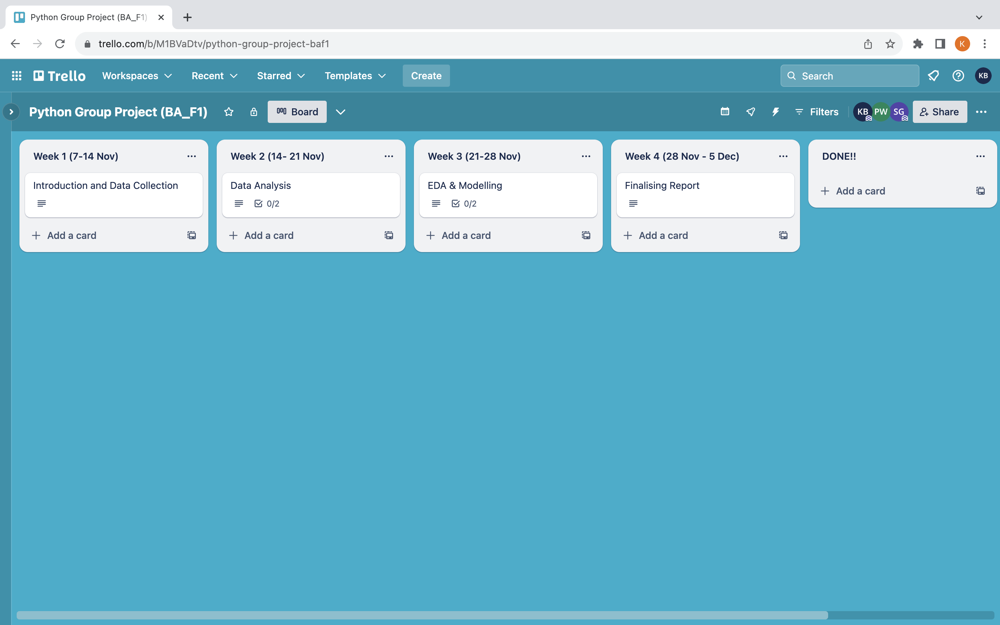

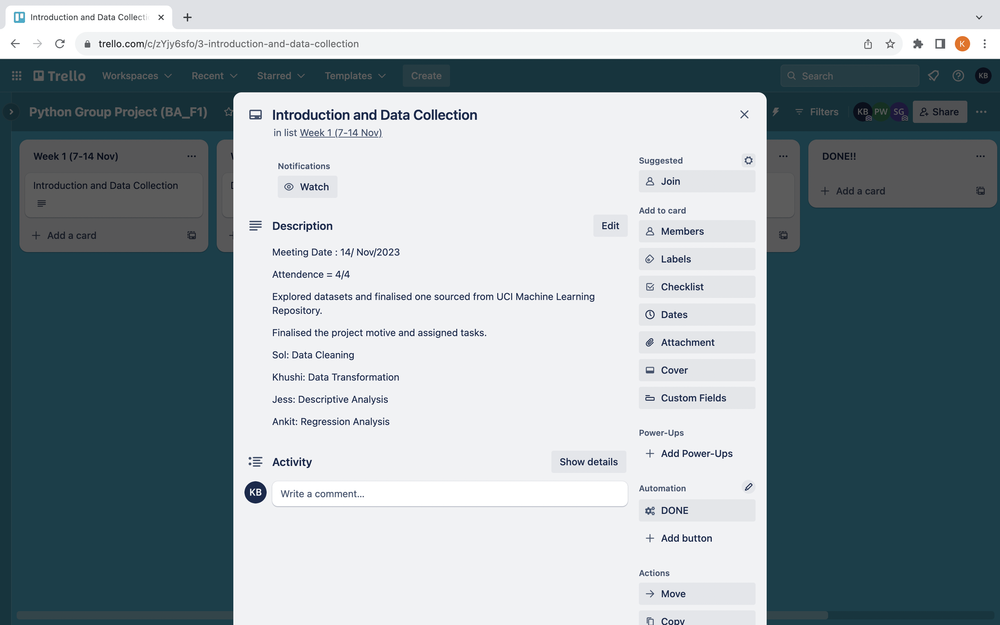

In [63]:
from IPython.display import Image 
Image("Week 1.png") 
Image("Week 1 des.png")

In week 2, coding tasks were assigned to Sol and Khushi. Sol was responsible for Data Cleaning and writing the Introduction, including Problem Statement, Objectives, and Data. Khushi is tasked with Data Transformation and writing the Data Preparation section, covering Feature Selection, Dropping Missing Values, Data Transformation, and Revisiting the Data & Dropping False Data. The collaboration aims to complete both coding and written components seamlessly.

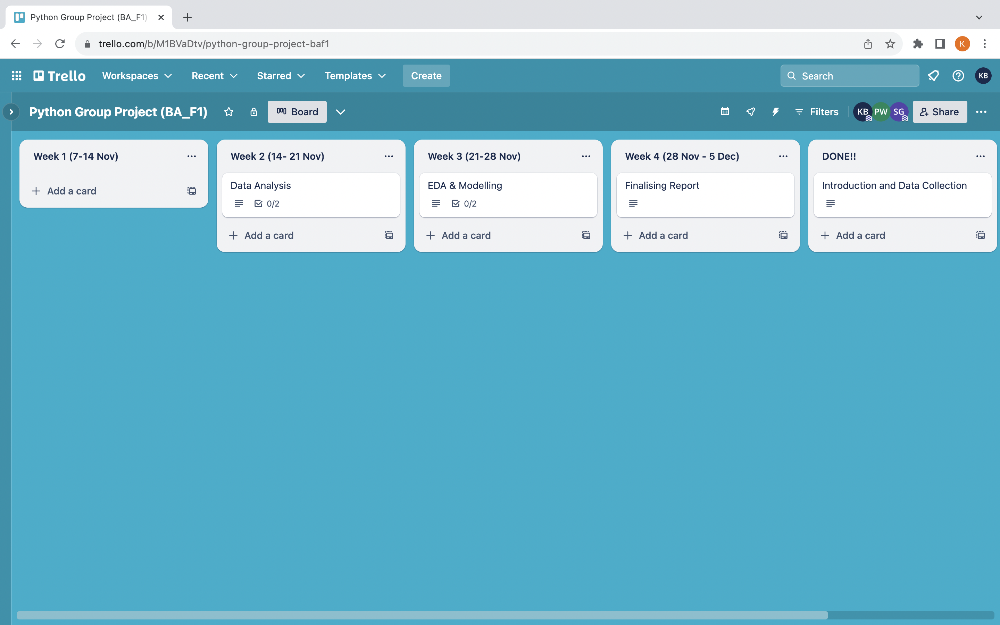

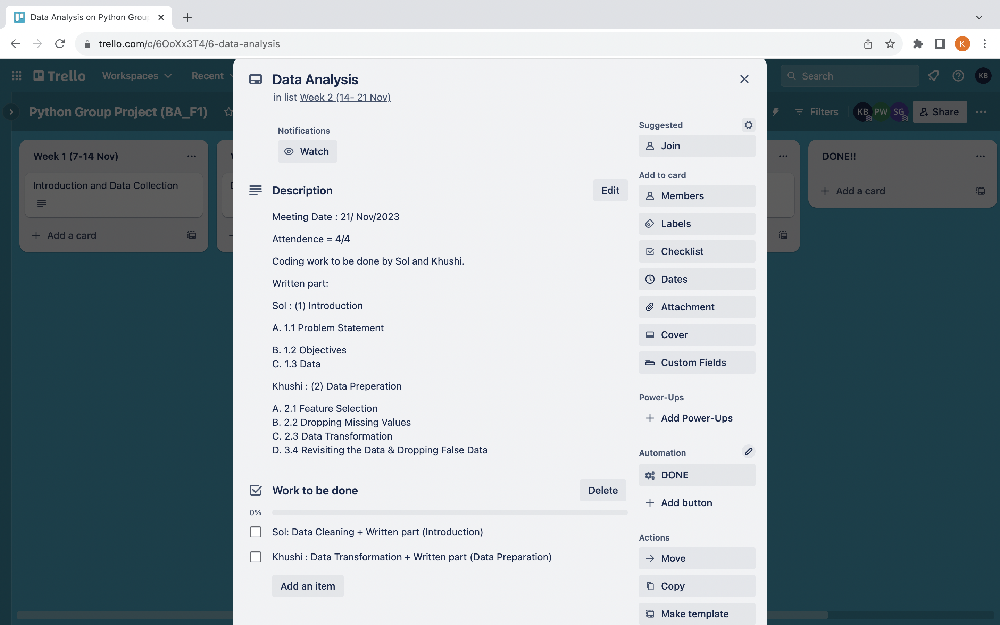

In [64]:
Image("Week 2.png") 
Image("Week 2 des.png")

In week 3, Jess and Ankit were assigned further coding tasks. Jess is responsible for conducting Descriptive and Exploratory Data Analysis, including Descriptive Analysis and Correlation Studies. Ankit is tasked with Predictive Models, involving Importing ML Libraries, Model #1, Model #2, and Model #3. Additionally, Ankit will cover Evaluations and Insights. The division of work entails Jess handling Descriptive Analysis and its written part, while Ankit manages Decision Tree Analysis along with its corresponding written component.

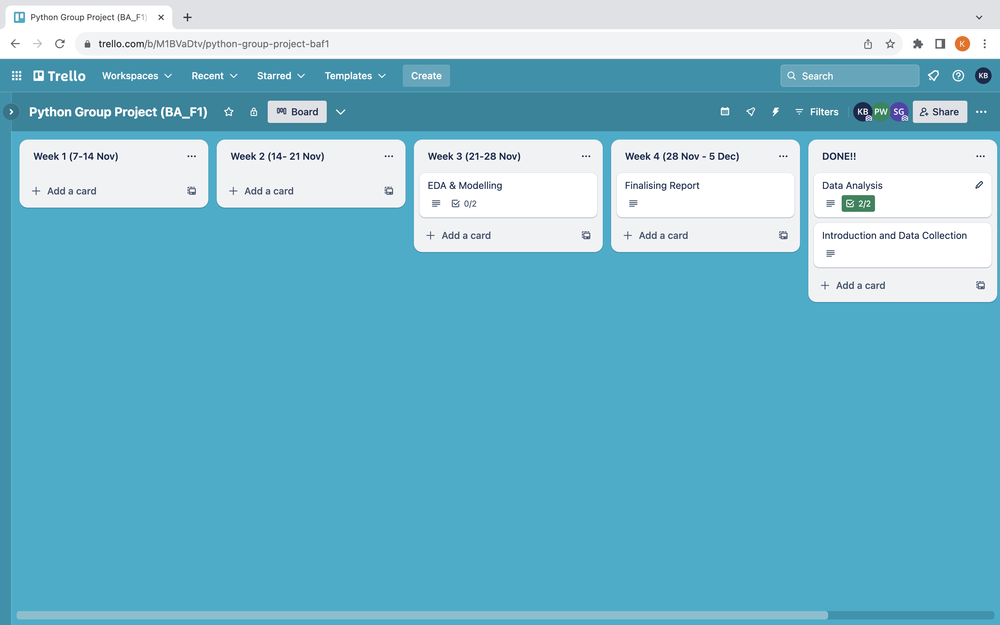

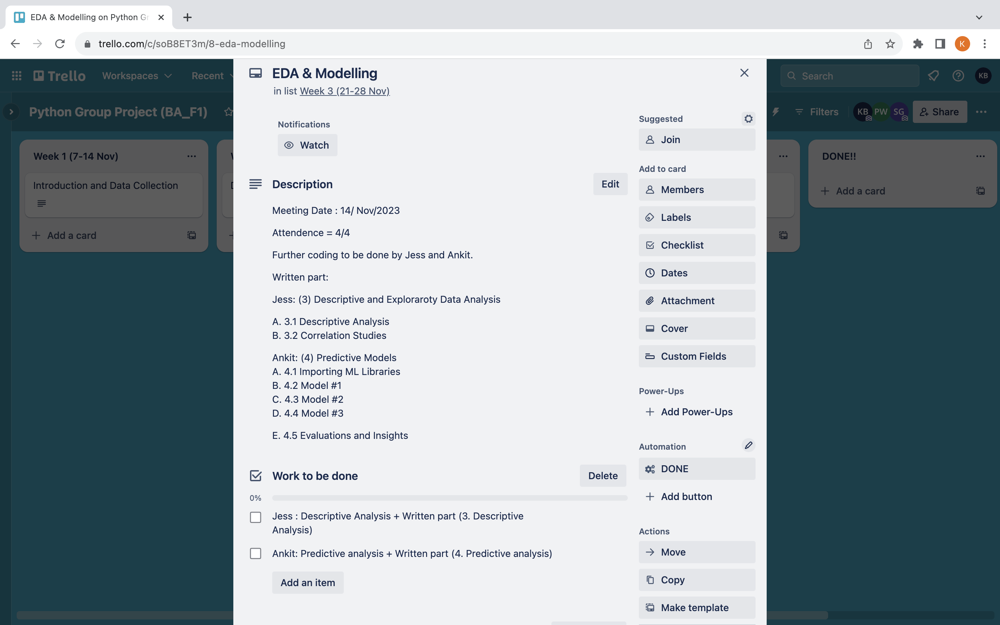

In [65]:
Image("Week 3.png") 
Image("Week 3 des.png")

In week 4, the focus was on discussions regarding changes made in the project and finalizing the project as much as possible in that meeting. The team agreed to collectively review the report for any errors, assess word count compliance, and ensure references are accurate and complete.

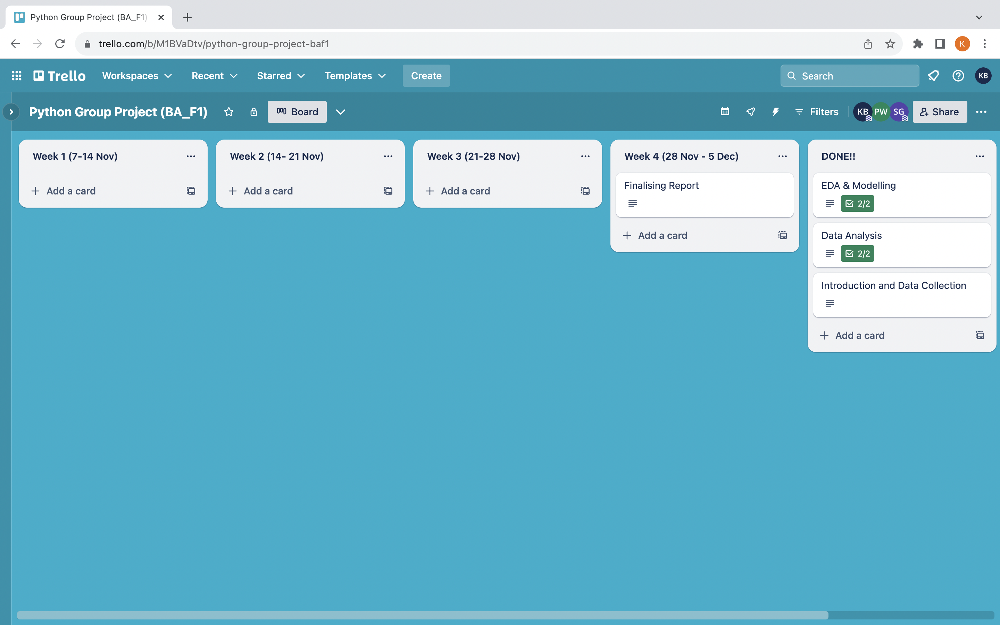

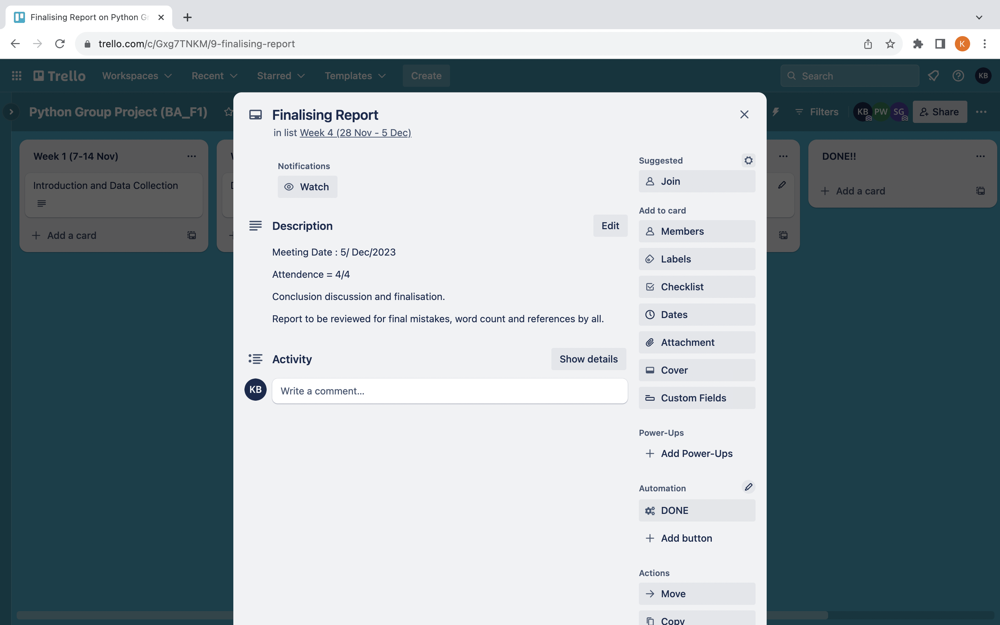

In [66]:
Image("Week 4.png") 
Image("Week 4 des.png")

We completed the group work in week5.

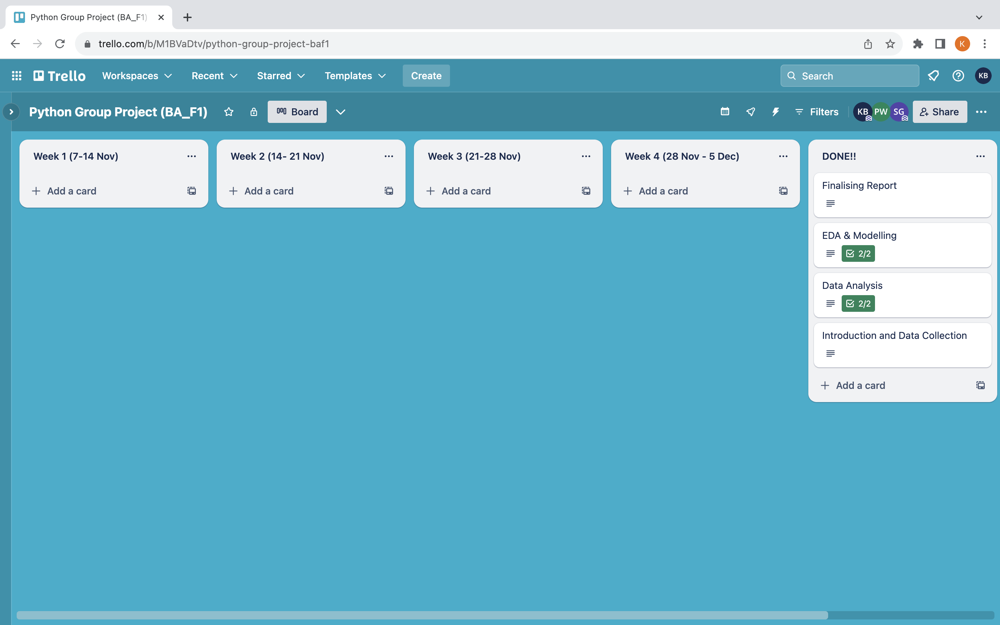

In [67]:
Image("Week 5.png")

In [68]:
from util1 import count_words_in_markdown

notebook_path = "./MSIN0143_2023_GROUP_F1.ipynb"

#Subtracting 975 and 326 - headings, indexing, formatting(in markdown cells)
#Subtracting 152 - Markdown cells of GridSearchCV and metric evaluation 

results = count_words_in_markdown(notebook_path) - 975 - 326 - 152


print(f'Total number of words in markdown cells: {results}')

Total number of words in markdown cells: 1988
